In this assignment, you'll get hands-on experience coding and training Generative Adversarial Networks or GANs. We will implement a specific type of GAN designed to process images, called a Deep Convolutional GAN (DCGAN). We'll train the DCGAN to generate natural images from CIFAR10. Let's get started. 


A GAN is a generative model that has the following network structure:

![discriminator](https://drive.google.com/uc?export=view&id=19LkOTaowOrNhIKvjXWvO6qhFVUNZMF5Y)

A DCGAN is simply a GAN that uses a convolutional neural network as the discriminator, and a network composed of transposed convolutions as the generator. To implement the DCGAN, we need to specify three things: 


1.   the Discriminator
2.   the Generator
3.   the training Procedure



## **Part 1: Implement the Discriminator of the DCGAN**

The discriminator in the DCGAN you will implement is a convolutional neural network with the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=1KrqS_AyjHIm7leVh58pjVRmnGx-le1vB)


1.   **Padding**: In each of the convolutional layers shown above, we downsample the spatial dimension of the input volume by a factor of 2. Given that we kernel size $K=5$ and stride $S=2$, what should the padding be? Write your answer below in the colab, and show your work (i.e. the formula you used to derived the padding.)
2.   **Implementation**: Implement the above architecture in the ```define_discriminator``` routine below and return the model.






## Answer

To get the padding, we can use the equation we learned in class:

$r = \frac {n + 2p - f}{s}  + 1$,

to get the padding p:

$p = \frac {s(r-1) + f - n} {2}$,

where `s = stride = 2`, `f = kernel size = 5`, `p = padding`, `r = resultant dimension = 16`, and `n = input image dimensions = 32`

to get the following:

$p = 2$


##Discriminator Implementation

To define the discriminator, we note the following things about its structure from lecture:

- We can apply Batch Normalization everywhere except the discriminator input
- We use LeakyReLU for the discriminator

To build the model, we simply followed the diagram provided above, where we applies four convolutions. The last convolution we generated a 2x2x256, then applied `Flatten()` and then a FC layer.

In [ ]:
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from tensorflow.keras.models import load_model
import numpy as np


def define_discriminator(input_shape=(32,32,3)):
	
	kernel = 5
	stride = 2

	assert input_shape == (32,32,3)
 
	# create model
	model = keras.Sequential()

	# 1st conv
	model.add(keras.layers.Conv2D(filters=32,kernel_size=kernel,padding='same',strides=stride,input_shape=(32,32,3)))
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	model.add(keras.layers.BatchNormalization())
	# print(f"1st conv2d: output_shape: {model.output_shape}")

	# 2nd conv
	model.add(keras.layers.Conv2D(filters=64,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	# print(f"2nd conv2d: output_shape: {model.output_shape}")

	# 3rd conv
	model.add(keras.layers.Conv2D(filters=128,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	# print(f"3rd conv2d: output_shape: {model.output_shape}")
	
	# 4th convolution
	model.add(keras.layers.Conv2D(filters=256,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
 
	# FC layer
	model.add(keras.layers.Flatten())
 
	# output
	model.add(keras.layers.Dense(1 ,activation='sigmoid'))
 
	# define optimizer
	opt = keras.optimizers.Adam(learning_rate=3e-5, beta_1 = 0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['binary_accuracy'])

	return model


## **Part 2: Implement the Generator**

Now, we will implement the generator of the DCGAN in ```define_generator```, which consists of a sequence of transpose convolutional layers that progressively upsample the input noise sample to generate a fake image. Since the training of the generator involves an end-to-end cost function involving both the generator and the discriminator, you should also define a combined GAN model in ``define_gan``. Note that the discriminator portion is frozen (setting ``trainable`` to ``False``) as the weights of the discriminator are not modified during the training of the generator. The generator has the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=18RwpQChvU1FLfnCEfMiJKsKklsOkDyTS)



##Generator Implementation

To create the generator, we followed the structure presented in class, where:

- We apply Batch Normalization on all layers except for the generator output
- We apply ReLU through the generator except at the output
- At the output, we apply a `tanh` activation


To implement the generator, we also followed the diagram above and played around with the ReLU values. Since the input has an `input_shape` of dimenstion `100`, we made a dense layer and reshaped it to a 4x4x128. Then, we followed the diagram, following the number of filters, kernel stride, and kernel size as specified above. 

For the GAN, we set the discriminator training to `False` because we need to train the discriminator separately. In the GAN, we generate a latent vector of dimension 100 and put it through the generator. Then, we used the output fake image as the input to the discriminator to get a decision. This decision and the original latent vector are used to create the GAN model, since we want an output decision and a model that takes in a latent vector.

In [ ]:
# define the standalone generator model
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from keras.models import model_from_json
import keras.initializers as initializers
import numpy as np

def define_generator(latent_dim=100):

    # create model   
    model = keras.Sequential()

    # reshape input to 4x4x128
    model.add(keras.layers.Dense(4*4*128, input_shape=(latent_dim,)))
    model.add(keras.layers.Reshape((4, 4, 128)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"after linear and reshape: output_shape: {model.output_shape}")

    # 1st conv
    model.add(keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same'))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"1st conv2d_transpose: output_shape: {model.output_shape}")
    
    # 2nd conv
    model.add(keras.layers.Conv2DTranspose(32, kernel_size=5, strides=2, padding='same'))    
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"2nd conv2d_transpose: output_shape: {model.output_shape}")

    # 3rd conv
    model.add(keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', activation='tanh'))
    # print(f"3rd conv2d_transpose: output_shape: {model.output_shape}")

    return model


# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):

  # make weights in the discriminator not trainable
  d_model.trainable = False
  
  # Define your combined model here 
  x = keras.layers.Input(shape=(100,))
  img = g_model(x)
  decision = d_model(img)

  model = keras.models.Model(inputs=x,outputs=decision)
  model.compile(keras.optimizers.Adam(learning_rate=3e-4, beta_1 = 0.95), loss='binary_crossentropy', metrics=['binary_accuracy'])
  return model


# print out discriminator summary
discriminator = define_discriminator()
discriminator.summary()

# print out generator summary
generator = define_generator()
generator.summary()

# print out GAN summary
gan = define_gan(generator, discriminator)
gan.summary()


Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 16, 16, 32)        2432      
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 16, 16, 32)        128       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 8, 8, 64)          51264     
_________________________________________________________________
batch_normalization_9 (Batch (None, 8, 8, 64)          256       
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 8, 8, 64)         

In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

## **Part 3: Training the model**

Instantiate the following routine ``train`` to train a DCGAN. The basic procedure goes like the followings. For each batch in each epoch: 

1.   Randomly sample a batch size of real images and give each of them a "real" label
2.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "fake" label.
3.   Use the data from 1 and 2 as training data to train only the discriminator 
4.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "real" label.
5.   Use the data to train the combined network. 

To monitor the progress, print out the performance of the discriminator network every episode and five randomly generated images every 5 episodes. As the training may take a significant amount of time, please save all the models in ``outputdir`` every episode in case you need to stop and restart the training process. 


##Training Implementation

To train the model, we assume the input dataset `dataset` is already divided into batches. Then, we can iterate through all the batches per epoch. In a single epoch, we convert the batch into a `numpy` list. This batch contains the $real$ $images$ that we will train our disriminator on. The $real$ $images$ are input to the discriminator are given $real$ $labels$ of the value $1$. So we have something like:

`d_loss_real_imgs = d_model.train_on_batch(real_data, np.ones((batch_size,1))`

We do the same thing for $fake$ $images$, where we can generate fake images from the generator model. The output is given $label = 0$, where we have

`d_loss_fake_imgs = d_model.train_on_batch(fake_data, np.zeros((batch_size,1))`

For the GAN, we train it with the input (100,). In the GAN, fake images will be generated and we given then a real label and get the loss.


In [ ]:
import time
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from keras.datasets import cifar10
import numpy as np

batch_size = 128

# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, outputdir='/training_checkpoints/', latent_dim=100, n_epochs=400, n_batch=128):

  print(f"Number of epochs: {n_epochs}")
  print(f"Number of batches: {n_batch}")

  checkpoint_prefix = os.path.join(outputdir, "ckpt")
  model_filename = 'model_checkpoint'

  # go through all batches per epoch
  for epoch in range(n_epochs):

    start = time.time()

    # get a batch of real images and give them a real label
    for data_batch in dataset:

      # convert to numpy array
      # shape: 128x32x32x3
      data = np.stack(list(data_batch))

      # generate noise for creating fake images in step 2
      random_noise = np.random.normal(size=(n_batch,latent_dim))

      # train the discriminator
      d_model.training = True

      # compute the loss for the discriminator - compare the real images with a bunch of ones
      # ones are used to label 'real' images
      d_loss_real_imgs = d_model.train_on_batch(x=data, y=np.ones((128,1)))
      random_img = g_model.predict_on_batch(random_noise)
      d_loss_fake_imgs = d_model.train_on_batch(x=random_img, y=np.zeros((128,1)))

      loss = (d_loss_fake_imgs[0] + d_loss_real_imgs[0])

      d_model.training = False
      gan_loss = gan_model.train_on_batch(x=random_noise,y=np.ones((128,1)))

    print(f"epoch = {epoch+1}/{n_epochs}, d_loss={loss:0.3f}, g_loss={gan_loss[0]:0.3f}")

    if (epoch % 5 == 0):
        samples = 10
        x_fake = g_model.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))

        plt.tight_layout()
        plt.show()

    if(epoch + 1 % 20 == 0):
      # we will save model checkpoints to continue training in case of kernel death
      # model_filename_gan = 'gan_train.{0:03d}.hdf5'
      # model_filename_g = 'generator_train.{0:03d}.hdf5'
      # model_filename_d = 'discriminator_train.{0:03d}.hdf5'
      model_filename_gan = 'gan_train.hdf5'
      model_filename_g = 'generator_train.hdf5'
      model_filename_d = 'discriminator_train.hdf5'
      save_model(gan, model_filename_gan)
      save_model(gan, model_filename_g)
      save_model(gan, model_filename_d)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))





## **Part 4: Experiment**

This is where you put everything together and test it on CIFAR10. In the other part of the lab, you have already built a classifier for CIFAR10. For this experiment, you will use the same set of training images to build a DCGAN and then use the resulting generator to create 50,000 fake images. These fake images have no class labels but you can predict them using the classifier you built earlier. Now treating these fake images and predicted labels as training data, build a brand new classifier for CIFAR10 and compare its performance with the original one trained on the raw data. 

1.   Comment on any differences between their performances. Without running additional experiments, do you think the performance of the classifier trained on fake images will improve if you use 500,000 fake images instead of 50,000?
2.   You might wonder why anyone would use fake data to train classifier. As it turns out, this is a useful strategy to protect privacy of sensitive original data, especially in frederated learning when sensitive data need to be aggregated from many different sites. Inspecting a random set of fake images, do you think that they disclose any of the raw images from the original CIFAR10 dataset? 





###Answers to Q1 and Q2
1. Based on the results below, the images are much darker compared to the original CIFAR10 classifier trained on the original images. This is because the output images from the 100th epoch after training the DCGAN shows that the images are not clear and are dark in color. Our output from the generator is not that good. If we trained on 500k fake images from the generator, the output would not improve in this case, since the fake images are already wrong. If our DCGAN was well-trained though, then 500k results would improve the NN.

2. For a DCGAN that is working better than ours, then the output images generated by the GAN is different enough from the original images, so the raw images are not disclosed. Therefore, we can use the fake images instead of the original/raw images. Therefore, we believe that privacy comes in tandem with a well-trained model.


#**Experiment Implementation**

As mentioned in the previous instructions, what we did first was training a classifier, like in part 1

In [ ]:
import tensorflow as tf
import keras
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
from keras.utils import np_utils

# import necessary building blocks
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential
from collections import defaultdict
import tqdm
from keras.models import save_model
from sklearn.metrics import confusion_matrix, accuracy_score
from keras.datasets import cifar10

%tensorflow_version 1.x
%matplotlib inline

TensorFlow is already loaded. Please restart the runtime to change versions.


In [ ]:
###To save the model in google drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import os
import sys

model_path = "/content/gdrive/My Drive/DL/cifar.hdf5"
model_path_weight = "/content/gdrive/My Drive/DL/weights.h5"
model_path_json="/content/gdrive/My Drive/DL/model.json"

###Load cifar10 dataset

In [ ]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

print("Train samples:", x_train.shape, y_train.shape)
print("Test samples:", x_test.shape, y_test.shape)

NUM_CLASSES = 10
cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
                   "dog", "frog", "horse", "ship", "truck"]

Train samples: (50000, 32, 32, 3) (50000, 1)
Test samples: (10000, 32, 32, 3) (10000, 1)


### Prepare data 

We need to normalize inputs like this: $$x_{norm} = \frac{x}{255} - 0.5$$

We need to convert class labels to one-hot encoded vectors. Use __keras.utils.to_categorical__.

In [ ]:
# normalize inputs
x_train2  = [((x/255) - 0.5) for x in x_train]
x_train2 = np.array(x_train2)
x_test2   = [((x/255) - 0.5) for x in x_test]
x_test2 = np.array(x_test2)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_train)
print(y_train2.shape)
y_test2 = keras.utils.to_categorical(y_test)
print(y_test2.shape)

(50000, 10)
(10000, 10)


## Classifier CNN architecture

In [ ]:
def make_model():

    NUM_CLASSES = 10

    model = Sequential()  # start feed-forward model definition

    model.add(keras.layers.Conv2D(filters=16, kernel_size=3, padding='same', input_shape=(32, 32, 3)))  # first layer needs to define "input_shape"
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=64, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))
    model.add(Flatten())

    # model.add(Dense(256, input_shape=(50000,)))
    model.add(Dense(256))
    model.add(LeakyReLU(0.1))
    model.add(Dropout(0.5))
    
    model.add(Dense(NUM_CLASSES))  # the last layer with neuron for each class
    model.add(LeakyReLU(0.1))
    model.add(Activation("softmax"))  # output probabilities
    
    return model
  

### Train model

Training of your model can take approx. 4-8 minutes per epoch. The whole process takes approximately **1.5 hours**. You're aiming for ~0.80 validation accuracy.

During training you should observe the decrease in reported loss on training and validation.

If the loss on training is not decreasing with epochs you should revise your model definition and learning rate.

In [ ]:
class TqdmProgressCallback(keras.callbacks.Callback):

    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']

    def on_epoch_begin(self, epoch, logs=None):
        print('Epoch %d/%d' % (epoch + 1, self.epochs))
        if "steps" in self.params:
            self.use_steps = True
            self.target = self.params['steps']
        else:
            self.use_steps = False
            self.target = self.params['samples']
        self.prog_bar = tqdm.tqdm_notebook(total=self.target)
        self.log_values_by_metric = defaultdict(list)

    def _set_prog_bar_desc(self, logs):
        for k in self.params['metrics']:
            if k in logs:
                self.log_values_by_metric[k].append(logs[k])
        desc = "; ".join("{0}: {1:.4f}".format(k, np.mean(values)) for k, values in self.log_values_by_metric.items())
        if hasattr(self.prog_bar, "set_description_str"):  # for new tqdm versions
            self.prog_bar.set_description_str(desc)
        else:
            self.prog_bar.set_description(desc)

    def on_batch_end(self, batch, logs=None):
        logs = logs or {}
        if self.use_steps:
            self.prog_bar.update(1)
        else:
            batch_size = logs.get('size', 0)
            self.prog_bar.update(batch_size)
        self._set_prog_bar_desc(logs)

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        self._set_prog_bar_desc(logs)
        self.prog_bar.update(1)  # workaround to show description
        self.prog_bar.close()


class ModelSaveCallback(keras.callbacks.Callback):

    def __init__(self, file_name):
        super(ModelSaveCallback, self).__init__()
        self.file_name = file_name

    def on_epoch_end(self, epoch, logs=None):
        model_filename = self.file_name.format(epoch)
        save_model(self.model, model_filename)
        print("Model saved in {}".format(model_filename))

In [ ]:
#Neo_model=0
#if Neo_model==1:
INIT_LR = 5e-3  # initial learning rat
BATCH_SIZE = 32
EPOCHS = 100
if os.path.isfile(model_path) and os.path.isfile(model_path_weight) and os.path.isfile(model_path_json):
  json_file = open(model_path_json, 'r')
  loaded_model_json = json_file.read()
  json_file.close()
  model = model_from_json(loaded_model_json)
  model.load_weights(model_path_weight)
  print("Loaded model from gdrive")

  INIT_LR = 5e-3
  last_finished_epoch=0
  start_LR= INIT_LR *( 0.95 **Last_finished_epoch)

  model.compile( loss='categorical_crossentropy',  # we train 10-way classification
         optimizer=keras.optimizers.adamax(lr=start_LR),  # for SGD
        metrics=['accuracy']  # report accuracy during training
        )
  def lr_scheduler(epoch):
    return start_LR * 0.95 ** (epoch-Last_finished_epoch)

  class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
      print("Learning rate:", K.get_value(model.optimizer.lr)) 
else:


  # scheduler of learning rate (decay with epochs)
  def lr_scheduler(epoch):
      return INIT_LR * 0.95 ** epoch

  class LrHistory(keras.callbacks.Callback):
      def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model.optimizer.lr))



  last_finished_epoch = None
  model = make_model()  # define our model

# prepare model for fitting (loss, optimizer, etc)
  model.compile(
         loss='categorical_crossentropy',  # we train 10-way classification
         optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
        metrics=['accuracy']  # report accuracy during training
       )
# fit model
model.fit(
      x_train2, y_train2,  # prepared data
      batch_size=BATCH_SIZE,
      epochs=EPOCHS,  
      callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
                LrHistory(), 
                TqdmProgressCallback(),
                ModelSaveCallback(model_path)],
      #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)
  # save weights to file
model.save_weights(model_path_weight)
model_json = model.to_json()
with open(model_path_json, "w") as json_file:
  json_file.write(model_json)
print("Saved model to drive")



Loaded model from gdrive
Learning rate: 0.005
Epoch 1/100


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00475
Epoch 2/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0045125
Epoch 3/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.004286875
Epoch 4/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.004072531
Epoch 5/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0038689047
Epoch 6/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0036754594
Epoch 7/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0034916864
Epoch 8/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.003317102
Epoch 9/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.003151247
Epoch 10/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0029936847
Epoch 11/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0028440005
Epoch 12/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0027018005
Epoch 13/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0025667103
Epoch 14/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0024383748
Epoch 15/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.002316456
Epoch 16/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0022006333
Epoch 17/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0020906017
Epoch 18/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0019860717
Epoch 19/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.001886768
Epoch 20/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0017924296
Epoch 21/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0017028081
Epoch 22/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0016176677
Epoch 23/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0015367843
Epoch 24/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0014599451
Epoch 25/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0013869478
Epoch 26/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0013176005
Epoch 27/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0012517205
Epoch 28/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0011891344
Epoch 29/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0011296778
Epoch 30/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0010731939
Epoch 31/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0010195341
Epoch 32/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00096855743
Epoch 33/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00092012953
Epoch 34/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00087412307
Epoch 35/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0008304169
Epoch 36/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00078889605
Epoch 37/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0007494513
Epoch 38/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0007119787
Epoch 39/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0006763798
Epoch 40/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0006425608
Epoch 41/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00061043276
Epoch 42/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0005799111
Epoch 43/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00055091555
Epoch 44/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00052336976
Epoch 45/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0004972013
Epoch 46/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00047234123
Epoch 47/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00044872417
Epoch 48/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00042628794
Epoch 49/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00040497354
Epoch 50/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00038472487
Epoch 51/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00036548864
Epoch 52/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0003472142
Epoch 53/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0003298535
Epoch 54/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00031336083
Epoch 55/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00029769278
Epoch 56/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00028280815
Epoch 57/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00026866773
Epoch 58/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00025523434
Epoch 59/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00024247263
Epoch 60/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00023034899
Epoch 61/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00021883154
Epoch 62/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00020788997
Epoch 63/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00019749546
Epoch 64/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0001876207
Epoch 65/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00017823966
Epoch 66/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00016932767
Epoch 67/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.0001608613
Epoch 68/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00015281823
Epoch 69/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00014517731
Epoch 70/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00013791845
Epoch 71/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00013102253
Epoch 72/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00012447141
Epoch 73/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00011824783
Epoch 74/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00011233544
Epoch 75/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.00010671867
Epoch 76/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 0.000101382735
Epoch 77/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 9.63136e-05
Epoch 78/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 9.149792e-05
Epoch 79/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 8.692302e-05
Epoch 80/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 8.257687e-05
Epoch 81/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 7.844803e-05
Epoch 82/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 7.4525626e-05
Epoch 83/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 7.0799346e-05
Epoch 84/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 6.725938e-05
Epoch 85/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 6.389641e-05
Epoch 86/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 6.070159e-05
Epoch 87/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 5.7666508e-05
Epoch 88/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 5.4783184e-05
Epoch 89/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 5.2044026e-05
Epoch 90/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 4.9441824e-05
Epoch 91/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 4.6969733e-05
Epoch 92/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 4.4621247e-05
Epoch 93/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 4.2390184e-05
Epoch 94/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 4.0270676e-05
Epoch 95/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 3.825714e-05
Epoch 96/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 3.6344285e-05
Epoch 97/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 3.452707e-05
Epoch 98/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 3.2800715e-05
Epoch 99/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Learning rate: 3.1160682e-05
Epoch 100/100



Model saved in /content/gdrive/My Drive/DL/cifar.hdf5
Saved model to drive


###Evaluate model

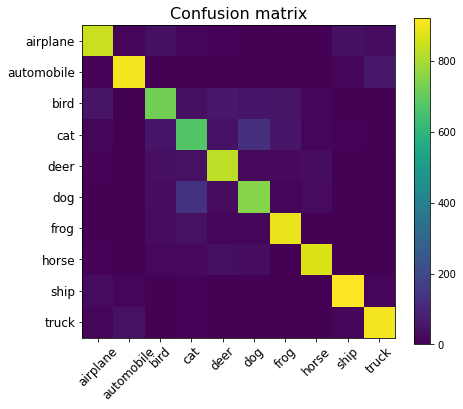

Test accuracy: 0.8321


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:28: MatplotlibDeprecationWarning: Passing unsupported keyword arguments to axis() will raise a TypeError in 3.3.


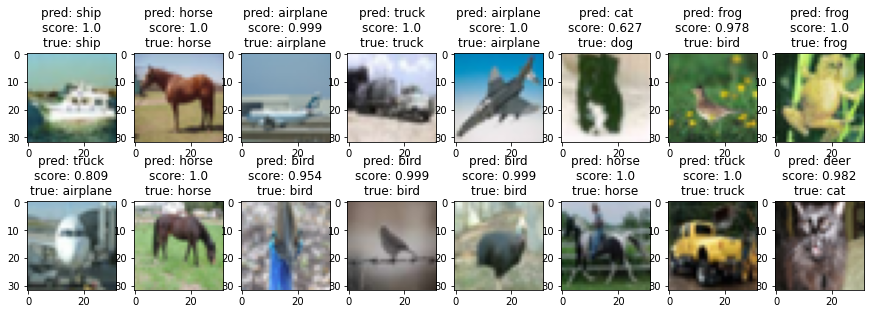

In [ ]:
# load weights from file (can call without model.fit)
model.load_weights(model_path_weight)

# make test predictions
y_pred_test = model.predict_proba(x_test2)
y_pred_test_classes = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)

# Show the confusion matrix and accuracy
plt.figure(figsize=(7, 6))
plt.title('Confusion matrix', fontsize=16)
plt.imshow(confusion_matrix(y_test, y_pred_test_classes))
plt.xticks(np.arange(10), cifar10_classes, rotation=45, fontsize=12)
plt.yticks(np.arange(10), cifar10_classes, fontsize=12)
plt.colorbar()
plt.show()
print("Test accuracy:", accuracy_score(y_test, y_pred_test_classes))

# inspect preditions
cols = 8
rows = 2
fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
for i in range(cols):
    for j in range(rows):
        random_index = np.random.randint(0, len(y_test))
        ax = fig.add_subplot(rows, cols, i * rows + j + 1)
        ax.grid(b=False)
        ax.axis(b=False)
        ax.imshow(x_test[random_index, :])
        pred_label = cifar10_classes[y_pred_test_classes[random_index]]
        pred_proba = y_pred_test_max_probas[random_index]
        true_label = cifar10_classes[y_test[random_index, 0]]
        ax.set_title("pred: {}\nscore: {:.3}\ntrue: {}".format(
               pred_label, pred_proba, true_label
        ))
plt.show()

##Experiment
The implementation for the experiment follows the steps below in the code given by the original problem description. Here we used the model of the above classifier c, and then used it to train the fake images generated from the generator, and finally used the fake labels and the fake images to train the classifier c'. The result shows that the acccuracy of the classifier c is 0.7919 and the accuracy of the classifier c' is 0.1. In the training process, the epoch was set to 200 in order to see if there's an improved result compared to epoch = 100. However, the results were not improved much and the potential reson is due to the training for the original classifier still need to be improved in oder to get a better result for the classifier c'. 

Number of epochs: 400
Number of batches: 128


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch = 1/400, d_loss=0.068, g_loss=3.859


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:58: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


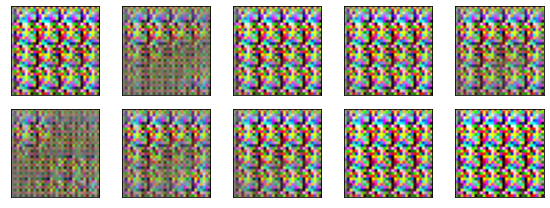

Time for epoch 1 is 30.302159786224365 sec
epoch = 2/400, d_loss=0.109, g_loss=5.118
Time for epoch 2 is 24.966967821121216 sec
epoch = 3/400, d_loss=0.071, g_loss=1.673
Time for epoch 3 is 24.594616413116455 sec
epoch = 4/400, d_loss=0.077, g_loss=3.953
Time for epoch 4 is 24.358933448791504 sec
epoch = 5/400, d_loss=0.050, g_loss=3.993
Time for epoch 5 is 24.652738332748413 sec
epoch = 6/400, d_loss=0.027, g_loss=5.623


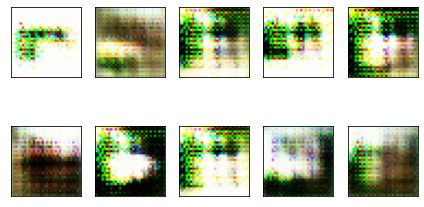

Time for epoch 6 is 24.822686433792114 sec
epoch = 7/400, d_loss=0.071, g_loss=4.399
Time for epoch 7 is 24.568612575531006 sec
epoch = 8/400, d_loss=0.031, g_loss=4.127
Time for epoch 8 is 24.600852727890015 sec
epoch = 9/400, d_loss=0.063, g_loss=2.956
Time for epoch 9 is 24.542200088500977 sec
epoch = 10/400, d_loss=0.179, g_loss=1.979
Time for epoch 10 is 24.341972827911377 sec
epoch = 11/400, d_loss=0.232, g_loss=2.331


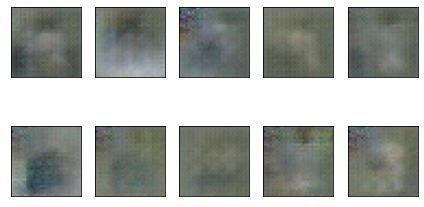

Time for epoch 11 is 24.814199686050415 sec
epoch = 12/400, d_loss=0.185, g_loss=4.707
Time for epoch 12 is 24.805366277694702 sec
epoch = 13/400, d_loss=0.236, g_loss=3.835
Time for epoch 13 is 24.389800786972046 sec
epoch = 14/400, d_loss=0.050, g_loss=4.685
Time for epoch 14 is 24.42162013053894 sec
epoch = 15/400, d_loss=0.186, g_loss=2.903
Time for epoch 15 is 24.36105728149414 sec
epoch = 16/400, d_loss=0.285, g_loss=4.144


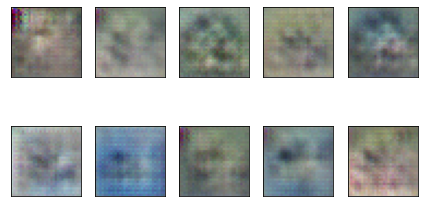

Time for epoch 16 is 24.694643259048462 sec
epoch = 17/400, d_loss=0.057, g_loss=3.723
Time for epoch 17 is 24.456185579299927 sec
epoch = 18/400, d_loss=0.108, g_loss=3.911
Time for epoch 18 is 24.44850254058838 sec
epoch = 19/400, d_loss=0.034, g_loss=5.064
Time for epoch 19 is 24.440674543380737 sec
epoch = 20/400, d_loss=0.117, g_loss=6.448
Time for epoch 20 is 24.55058789253235 sec
epoch = 21/400, d_loss=0.061, g_loss=4.583


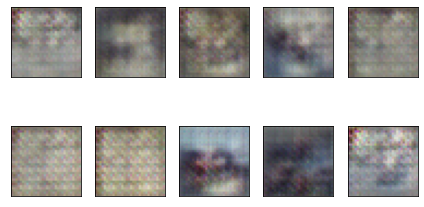

Time for epoch 21 is 24.82429838180542 sec
epoch = 22/400, d_loss=0.625, g_loss=6.750
Time for epoch 22 is 24.504274368286133 sec
epoch = 23/400, d_loss=0.028, g_loss=2.931
Time for epoch 23 is 24.529212474822998 sec
epoch = 24/400, d_loss=0.137, g_loss=3.409
Time for epoch 24 is 24.724616050720215 sec
epoch = 25/400, d_loss=0.058, g_loss=2.611
Time for epoch 25 is 24.72683882713318 sec
epoch = 26/400, d_loss=0.149, g_loss=3.608


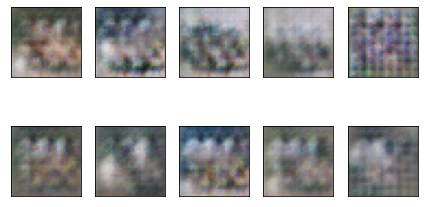

Time for epoch 26 is 24.964252948760986 sec
epoch = 27/400, d_loss=0.083, g_loss=5.973
Time for epoch 27 is 24.39346671104431 sec
epoch = 28/400, d_loss=0.141, g_loss=4.779
Time for epoch 28 is 24.379119396209717 sec
epoch = 29/400, d_loss=0.250, g_loss=3.102
Time for epoch 29 is 24.386297464370728 sec
epoch = 30/400, d_loss=0.084, g_loss=5.277
Time for epoch 30 is 24.309082746505737 sec
epoch = 31/400, d_loss=0.173, g_loss=4.389


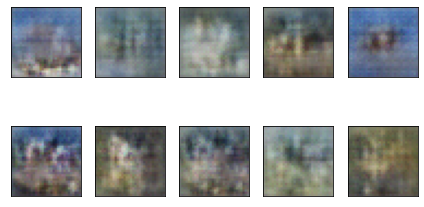

Time for epoch 31 is 24.733485221862793 sec
epoch = 32/400, d_loss=0.341, g_loss=3.481
Time for epoch 32 is 24.42618703842163 sec
epoch = 33/400, d_loss=2.073, g_loss=3.372
Time for epoch 33 is 24.28301692008972 sec
epoch = 34/400, d_loss=0.018, g_loss=8.179
Time for epoch 34 is 24.42505383491516 sec
epoch = 35/400, d_loss=0.126, g_loss=2.937
Time for epoch 35 is 24.266762495040894 sec
epoch = 36/400, d_loss=0.040, g_loss=4.515


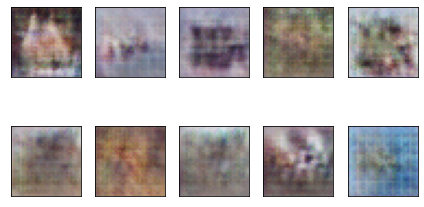

Time for epoch 36 is 24.668641805648804 sec
epoch = 37/400, d_loss=0.060, g_loss=4.645
Time for epoch 37 is 24.676395893096924 sec
epoch = 38/400, d_loss=0.025, g_loss=3.033
Time for epoch 38 is 24.315964460372925 sec
epoch = 39/400, d_loss=0.055, g_loss=3.988
Time for epoch 39 is 24.330484867095947 sec
epoch = 40/400, d_loss=0.034, g_loss=4.418
Time for epoch 40 is 24.394062280654907 sec
epoch = 41/400, d_loss=0.207, g_loss=5.971


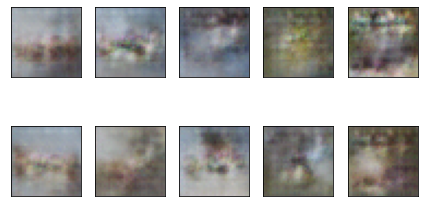

Time for epoch 41 is 24.741387844085693 sec
epoch = 42/400, d_loss=0.184, g_loss=5.606
Time for epoch 42 is 24.2923367023468 sec
epoch = 43/400, d_loss=0.487, g_loss=6.016
Time for epoch 43 is 24.535338640213013 sec
epoch = 44/400, d_loss=0.274, g_loss=2.623
Time for epoch 44 is 24.591466665267944 sec
epoch = 45/400, d_loss=0.202, g_loss=4.356
Time for epoch 45 is 24.362875938415527 sec
epoch = 46/400, d_loss=0.052, g_loss=4.506


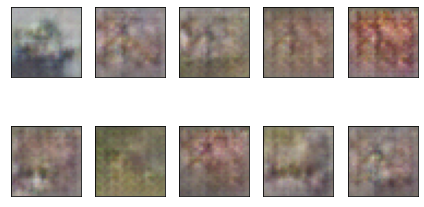

Time for epoch 46 is 24.886991262435913 sec
epoch = 47/400, d_loss=0.305, g_loss=4.621
Time for epoch 47 is 24.479373931884766 sec
epoch = 48/400, d_loss=0.029, g_loss=4.263
Time for epoch 48 is 24.38297939300537 sec
epoch = 49/400, d_loss=0.096, g_loss=3.959
Time for epoch 49 is 24.40408754348755 sec
epoch = 50/400, d_loss=0.196, g_loss=3.963
Time for epoch 50 is 24.844626665115356 sec
epoch = 51/400, d_loss=0.150, g_loss=5.641


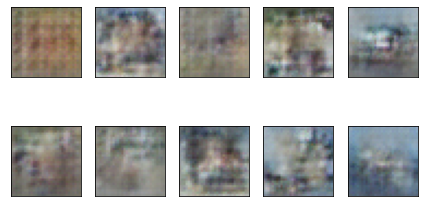

Time for epoch 51 is 24.637455701828003 sec
epoch = 52/400, d_loss=0.074, g_loss=1.850
Time for epoch 52 is 24.386505842208862 sec
epoch = 53/400, d_loss=0.031, g_loss=4.690
Time for epoch 53 is 24.381831407546997 sec
epoch = 54/400, d_loss=0.172, g_loss=5.111
Time for epoch 54 is 24.398172855377197 sec
epoch = 55/400, d_loss=0.012, g_loss=5.132
Time for epoch 55 is 24.270530939102173 sec
epoch = 56/400, d_loss=0.040, g_loss=5.586


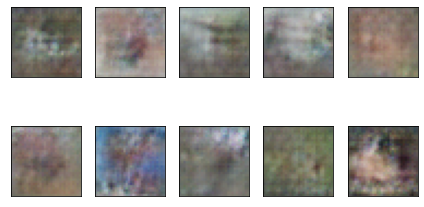

Time for epoch 56 is 24.619645595550537 sec
epoch = 57/400, d_loss=0.048, g_loss=3.756
Time for epoch 57 is 24.734808444976807 sec
epoch = 58/400, d_loss=0.031, g_loss=5.012
Time for epoch 58 is 24.31670570373535 sec
epoch = 59/400, d_loss=0.091, g_loss=7.811
Time for epoch 59 is 24.232943058013916 sec
epoch = 60/400, d_loss=0.299, g_loss=4.739
Time for epoch 60 is 24.32742738723755 sec
epoch = 61/400, d_loss=0.828, g_loss=7.267


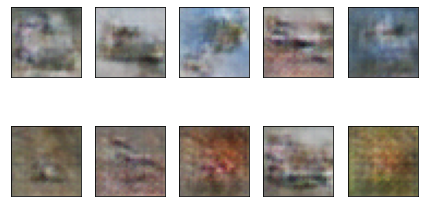

Time for epoch 61 is 24.6345694065094 sec
epoch = 62/400, d_loss=0.055, g_loss=5.475
Time for epoch 62 is 24.320988655090332 sec
epoch = 63/400, d_loss=0.168, g_loss=4.805
Time for epoch 63 is 24.650814533233643 sec
epoch = 64/400, d_loss=0.322, g_loss=4.289
Time for epoch 64 is 24.23654055595398 sec
epoch = 65/400, d_loss=0.325, g_loss=5.467
Time for epoch 65 is 24.26387357711792 sec
epoch = 66/400, d_loss=0.126, g_loss=5.844


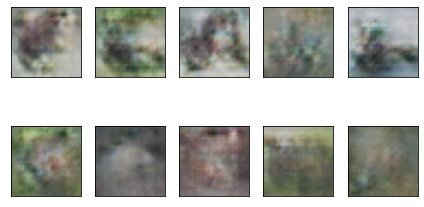

Time for epoch 66 is 24.77809715270996 sec
epoch = 67/400, d_loss=0.091, g_loss=4.368
Time for epoch 67 is 24.461061000823975 sec
epoch = 68/400, d_loss=0.031, g_loss=4.217
Time for epoch 68 is 24.426016807556152 sec
epoch = 69/400, d_loss=0.014, g_loss=4.636
Time for epoch 69 is 24.65756320953369 sec
epoch = 70/400, d_loss=0.431, g_loss=4.881
Time for epoch 70 is 24.48874521255493 sec
epoch = 71/400, d_loss=0.088, g_loss=5.009


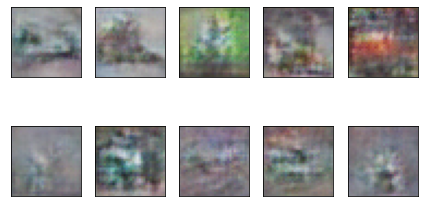

Time for epoch 71 is 24.73894715309143 sec
epoch = 72/400, d_loss=0.028, g_loss=3.098
Time for epoch 72 is 24.33332085609436 sec
epoch = 73/400, d_loss=0.195, g_loss=3.359
Time for epoch 73 is 24.38394021987915 sec
epoch = 74/400, d_loss=1.119, g_loss=2.950
Time for epoch 74 is 24.344374656677246 sec
epoch = 75/400, d_loss=0.040, g_loss=5.644
Time for epoch 75 is 24.561856985092163 sec
epoch = 76/400, d_loss=0.172, g_loss=5.193


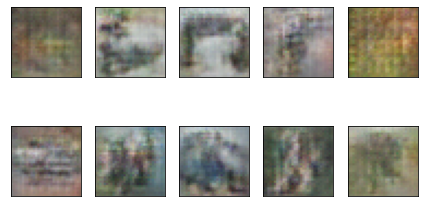

Time for epoch 76 is 24.660369396209717 sec
epoch = 77/400, d_loss=0.177, g_loss=3.993
Time for epoch 77 is 24.422072649002075 sec
epoch = 78/400, d_loss=0.130, g_loss=8.057
Time for epoch 78 is 24.28023362159729 sec
epoch = 79/400, d_loss=0.080, g_loss=5.394
Time for epoch 79 is 24.290679931640625 sec
epoch = 80/400, d_loss=0.070, g_loss=3.571
Time for epoch 80 is 24.442984580993652 sec
epoch = 81/400, d_loss=0.047, g_loss=3.774


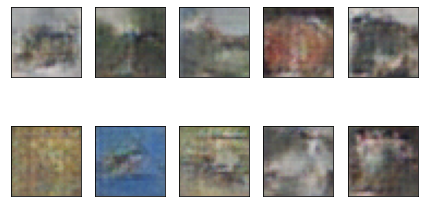

Time for epoch 81 is 24.690670013427734 sec
epoch = 82/400, d_loss=0.152, g_loss=3.548
Time for epoch 82 is 24.468475103378296 sec
epoch = 83/400, d_loss=0.089, g_loss=3.973
Time for epoch 83 is 24.517038822174072 sec
epoch = 84/400, d_loss=2.091, g_loss=2.542
Time for epoch 84 is 24.37741756439209 sec
epoch = 85/400, d_loss=0.122, g_loss=3.047
Time for epoch 85 is 24.38672113418579 sec
epoch = 86/400, d_loss=0.327, g_loss=3.690


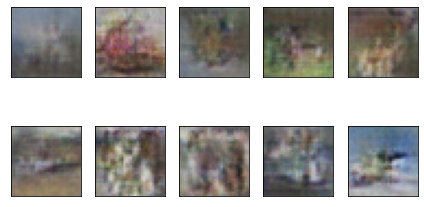

Time for epoch 86 is 25.141454696655273 sec
epoch = 87/400, d_loss=0.044, g_loss=5.414
Time for epoch 87 is 24.474153757095337 sec
epoch = 88/400, d_loss=0.071, g_loss=2.452
Time for epoch 88 is 24.653465270996094 sec
epoch = 89/400, d_loss=0.053, g_loss=2.247
Time for epoch 89 is 24.212708950042725 sec
epoch = 90/400, d_loss=0.274, g_loss=4.063
Time for epoch 90 is 24.426029205322266 sec
epoch = 91/400, d_loss=0.091, g_loss=5.105


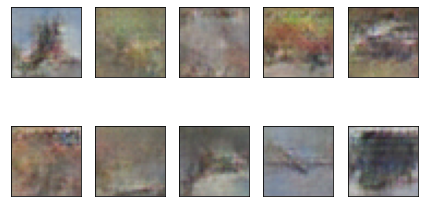

Time for epoch 91 is 24.48295521736145 sec
epoch = 92/400, d_loss=0.106, g_loss=3.909
Time for epoch 92 is 24.23452067375183 sec
epoch = 93/400, d_loss=0.097, g_loss=3.824
Time for epoch 93 is 24.242584943771362 sec
epoch = 94/400, d_loss=0.079, g_loss=5.612
Time for epoch 94 is 24.412184476852417 sec
epoch = 95/400, d_loss=0.091, g_loss=2.332
Time for epoch 95 is 24.195841789245605 sec
epoch = 96/400, d_loss=0.271, g_loss=3.409


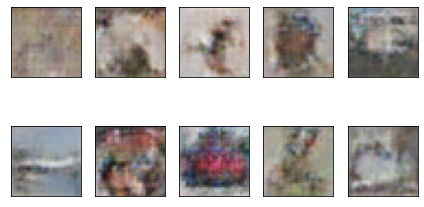

Time for epoch 96 is 24.677958011627197 sec
epoch = 97/400, d_loss=1.038, g_loss=2.068
Time for epoch 97 is 24.25778293609619 sec
epoch = 98/400, d_loss=0.077, g_loss=4.610
Time for epoch 98 is 24.316925764083862 sec
epoch = 99/400, d_loss=0.595, g_loss=0.479
Time for epoch 99 is 24.102181673049927 sec
epoch = 100/400, d_loss=0.202, g_loss=4.477
Time for epoch 100 is 24.32494807243347 sec
epoch = 101/400, d_loss=0.074, g_loss=2.226


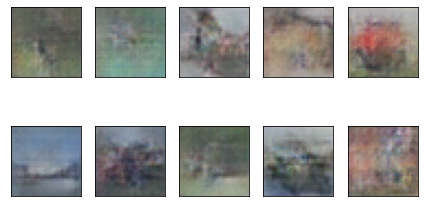

Time for epoch 101 is 25.113677978515625 sec
epoch = 102/400, d_loss=0.052, g_loss=3.956
Time for epoch 102 is 24.229522228240967 sec
epoch = 103/400, d_loss=0.042, g_loss=8.419
Time for epoch 103 is 24.29352116584778 sec
epoch = 104/400, d_loss=0.164, g_loss=3.622
Time for epoch 104 is 24.130425930023193 sec
epoch = 105/400, d_loss=0.520, g_loss=6.208
Time for epoch 105 is 24.384310722351074 sec
epoch = 106/400, d_loss=0.070, g_loss=2.051


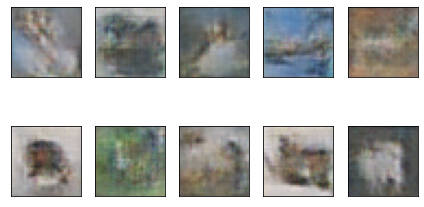

Time for epoch 106 is 24.792462825775146 sec
epoch = 107/400, d_loss=1.148, g_loss=5.845
Time for epoch 107 is 24.599161624908447 sec
epoch = 108/400, d_loss=0.230, g_loss=3.512
Time for epoch 108 is 24.24756145477295 sec
epoch = 109/400, d_loss=0.106, g_loss=4.307
Time for epoch 109 is 24.40679407119751 sec
epoch = 110/400, d_loss=0.092, g_loss=3.242
Time for epoch 110 is 24.48011040687561 sec
epoch = 111/400, d_loss=0.396, g_loss=3.272


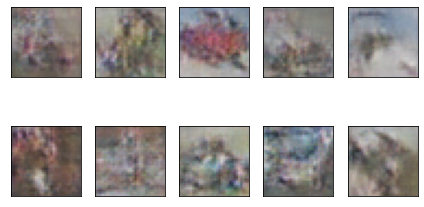

Time for epoch 111 is 24.728426694869995 sec
epoch = 112/400, d_loss=0.147, g_loss=4.110
Time for epoch 112 is 24.62988781929016 sec
epoch = 113/400, d_loss=0.670, g_loss=5.371
Time for epoch 113 is 24.944320917129517 sec
epoch = 114/400, d_loss=0.115, g_loss=2.413
Time for epoch 114 is 24.95755410194397 sec
epoch = 115/400, d_loss=0.145, g_loss=2.751
Time for epoch 115 is 24.836344242095947 sec
epoch = 116/400, d_loss=0.293, g_loss=3.646


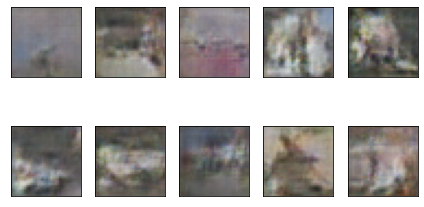

Time for epoch 116 is 25.330849170684814 sec
epoch = 117/400, d_loss=0.573, g_loss=3.133
Time for epoch 117 is 24.854812145233154 sec
epoch = 118/400, d_loss=0.015, g_loss=5.136
Time for epoch 118 is 24.917659282684326 sec
epoch = 119/400, d_loss=0.146, g_loss=4.200
Time for epoch 119 is 25.074728965759277 sec
epoch = 120/400, d_loss=0.094, g_loss=4.385
Time for epoch 120 is 24.754793405532837 sec
epoch = 121/400, d_loss=0.602, g_loss=3.617


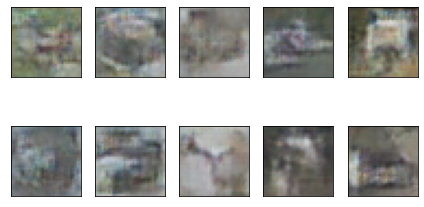

Time for epoch 121 is 25.02873396873474 sec
epoch = 122/400, d_loss=0.034, g_loss=3.369
Time for epoch 122 is 24.685545206069946 sec
epoch = 123/400, d_loss=0.112, g_loss=3.521
Time for epoch 123 is 24.73492431640625 sec
epoch = 124/400, d_loss=2.342, g_loss=2.414
Time for epoch 124 is 24.6290340423584 sec
epoch = 125/400, d_loss=0.063, g_loss=5.026
Time for epoch 125 is 24.66817831993103 sec
epoch = 126/400, d_loss=0.100, g_loss=7.274


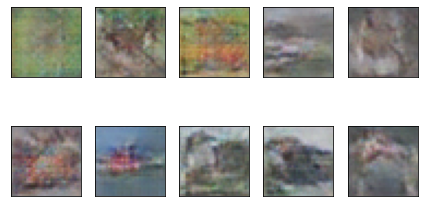

Time for epoch 126 is 25.56899905204773 sec
epoch = 127/400, d_loss=0.301, g_loss=3.387
Time for epoch 127 is 24.491278648376465 sec
epoch = 128/400, d_loss=0.175, g_loss=3.160
Time for epoch 128 is 24.50039577484131 sec
epoch = 129/400, d_loss=0.341, g_loss=3.791
Time for epoch 129 is 24.49305009841919 sec
epoch = 130/400, d_loss=0.175, g_loss=4.543
Time for epoch 130 is 24.480048656463623 sec
epoch = 131/400, d_loss=0.544, g_loss=4.738


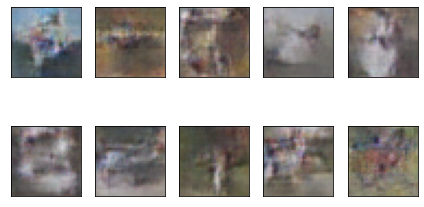

Time for epoch 131 is 24.79235291481018 sec
epoch = 132/400, d_loss=0.111, g_loss=2.093
Time for epoch 132 is 24.46306347846985 sec
epoch = 133/400, d_loss=0.046, g_loss=5.682
Time for epoch 133 is 24.324568033218384 sec
epoch = 134/400, d_loss=0.266, g_loss=2.596
Time for epoch 134 is 24.255848169326782 sec
epoch = 135/400, d_loss=0.053, g_loss=6.505
Time for epoch 135 is 24.3347589969635 sec
epoch = 136/400, d_loss=0.294, g_loss=6.854


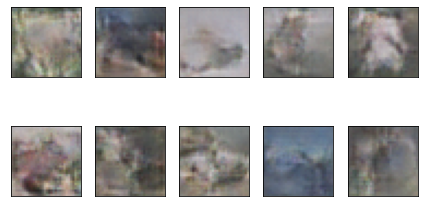

Time for epoch 136 is 24.79495406150818 sec
epoch = 137/400, d_loss=0.150, g_loss=3.125
Time for epoch 137 is 24.419312953948975 sec
epoch = 138/400, d_loss=0.027, g_loss=5.024
Time for epoch 138 is 24.593652486801147 sec
epoch = 139/400, d_loss=0.211, g_loss=3.249
Time for epoch 139 is 24.752193689346313 sec
epoch = 140/400, d_loss=0.098, g_loss=1.889
Time for epoch 140 is 24.33112120628357 sec
epoch = 141/400, d_loss=0.425, g_loss=3.489


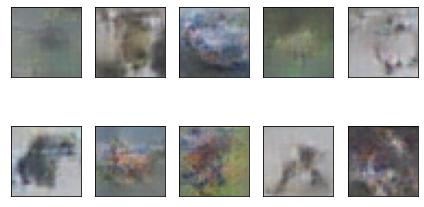

Time for epoch 141 is 24.78495764732361 sec
epoch = 142/400, d_loss=0.282, g_loss=3.297
Time for epoch 142 is 24.52247428894043 sec
epoch = 143/400, d_loss=0.613, g_loss=4.400
Time for epoch 143 is 24.47213077545166 sec
epoch = 144/400, d_loss=0.500, g_loss=5.378
Time for epoch 144 is 24.513540744781494 sec
epoch = 145/400, d_loss=0.184, g_loss=3.704
Time for epoch 145 is 24.390186309814453 sec
epoch = 146/400, d_loss=0.048, g_loss=1.836


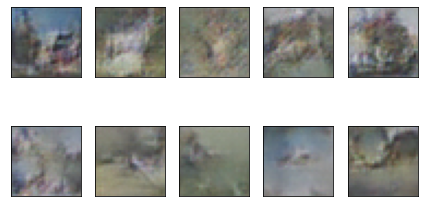

Time for epoch 146 is 24.810696601867676 sec
epoch = 147/400, d_loss=0.103, g_loss=3.781
Time for epoch 147 is 24.19953727722168 sec
epoch = 148/400, d_loss=0.908, g_loss=2.646
Time for epoch 148 is 24.38690185546875 sec
epoch = 149/400, d_loss=0.400, g_loss=4.976
Time for epoch 149 is 24.28076195716858 sec
epoch = 150/400, d_loss=0.135, g_loss=2.646
Time for epoch 150 is 24.2843759059906 sec
epoch = 151/400, d_loss=0.210, g_loss=3.112


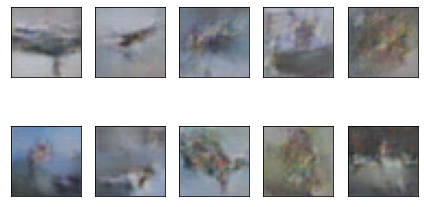

Time for epoch 151 is 24.92482089996338 sec
epoch = 152/400, d_loss=0.177, g_loss=3.711
Time for epoch 152 is 24.507553100585938 sec
epoch = 153/400, d_loss=0.274, g_loss=4.955
Time for epoch 153 is 24.360169410705566 sec
epoch = 154/400, d_loss=0.096, g_loss=3.635
Time for epoch 154 is 24.309649229049683 sec
epoch = 155/400, d_loss=0.153, g_loss=3.653
Time for epoch 155 is 24.4194917678833 sec
epoch = 156/400, d_loss=0.252, g_loss=3.125


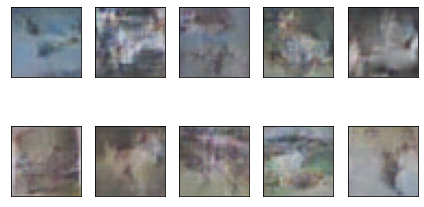

Time for epoch 156 is 24.80817222595215 sec
epoch = 157/400, d_loss=0.048, g_loss=4.504
Time for epoch 157 is 24.39099621772766 sec
epoch = 158/400, d_loss=0.062, g_loss=3.953
Time for epoch 158 is 24.368380308151245 sec
epoch = 159/400, d_loss=0.545, g_loss=4.128
Time for epoch 159 is 24.495763778686523 sec
epoch = 160/400, d_loss=0.141, g_loss=4.449
Time for epoch 160 is 24.347192525863647 sec
epoch = 161/400, d_loss=0.396, g_loss=1.611


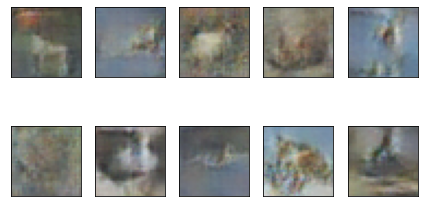

Time for epoch 161 is 24.684786081314087 sec
epoch = 162/400, d_loss=0.019, g_loss=3.369
Time for epoch 162 is 24.451058626174927 sec
epoch = 163/400, d_loss=0.456, g_loss=1.425
Time for epoch 163 is 24.29394793510437 sec
epoch = 164/400, d_loss=0.016, g_loss=4.676
Time for epoch 164 is 24.690120458602905 sec
epoch = 165/400, d_loss=0.084, g_loss=3.424
Time for epoch 165 is 24.42283296585083 sec
epoch = 166/400, d_loss=0.082, g_loss=5.033


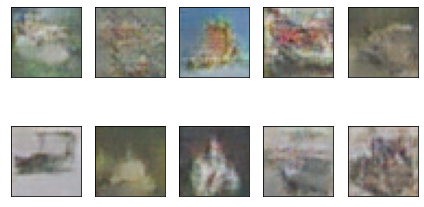

Time for epoch 166 is 24.816705465316772 sec
epoch = 167/400, d_loss=0.069, g_loss=3.332
Time for epoch 167 is 24.356209993362427 sec
epoch = 168/400, d_loss=0.303, g_loss=7.631
Time for epoch 168 is 24.27962064743042 sec
epoch = 169/400, d_loss=0.066, g_loss=5.362
Time for epoch 169 is 24.549090147018433 sec
epoch = 170/400, d_loss=0.034, g_loss=5.222
Time for epoch 170 is 24.367252826690674 sec
epoch = 171/400, d_loss=1.129, g_loss=3.337


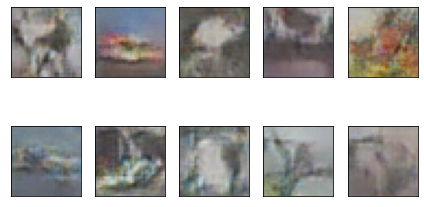

Time for epoch 171 is 24.681315898895264 sec
epoch = 172/400, d_loss=0.646, g_loss=2.247
Time for epoch 172 is 24.42337703704834 sec
epoch = 173/400, d_loss=0.767, g_loss=1.164
Time for epoch 173 is 24.38140368461609 sec
epoch = 174/400, d_loss=0.029, g_loss=3.093
Time for epoch 174 is 24.354682207107544 sec
epoch = 175/400, d_loss=0.111, g_loss=2.926
Time for epoch 175 is 24.474345922470093 sec
epoch = 176/400, d_loss=0.432, g_loss=1.345


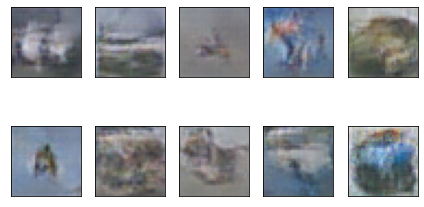

Time for epoch 176 is 24.769163131713867 sec
epoch = 177/400, d_loss=0.033, g_loss=3.336
Time for epoch 177 is 24.6333065032959 sec
epoch = 178/400, d_loss=0.047, g_loss=5.413
Time for epoch 178 is 24.418894052505493 sec
epoch = 179/400, d_loss=0.036, g_loss=4.175
Time for epoch 179 is 24.4561288356781 sec
epoch = 180/400, d_loss=0.189, g_loss=6.567
Time for epoch 180 is 24.407565355300903 sec
epoch = 181/400, d_loss=1.250, g_loss=2.879


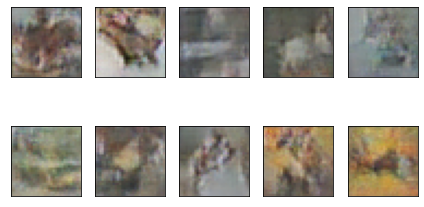

Time for epoch 181 is 24.789451599121094 sec
epoch = 182/400, d_loss=0.894, g_loss=1.057
Time for epoch 182 is 24.30444049835205 sec
epoch = 183/400, d_loss=0.123, g_loss=3.304
Time for epoch 183 is 24.357839107513428 sec
epoch = 184/400, d_loss=0.221, g_loss=6.928
Time for epoch 184 is 24.28463840484619 sec
epoch = 185/400, d_loss=0.028, g_loss=3.011
Time for epoch 185 is 24.468696355819702 sec
epoch = 186/400, d_loss=0.191, g_loss=3.386


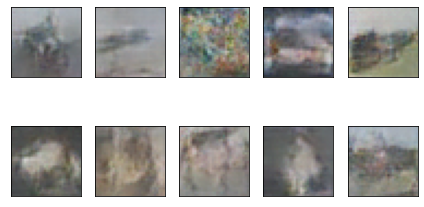

Time for epoch 186 is 24.70020627975464 sec
epoch = 187/400, d_loss=0.341, g_loss=1.701
Time for epoch 187 is 24.401811122894287 sec
epoch = 188/400, d_loss=0.042, g_loss=5.197
Time for epoch 188 is 24.3868350982666 sec
epoch = 189/400, d_loss=0.175, g_loss=3.393
Time for epoch 189 is 24.62963032722473 sec
epoch = 190/400, d_loss=0.332, g_loss=1.079
Time for epoch 190 is 24.493741035461426 sec
epoch = 191/400, d_loss=0.049, g_loss=2.859


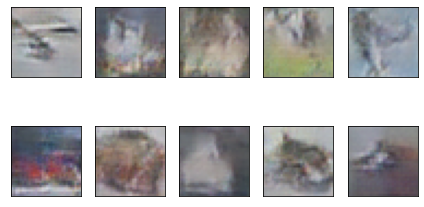

Time for epoch 191 is 24.74323010444641 sec
epoch = 192/400, d_loss=1.250, g_loss=2.552
Time for epoch 192 is 24.55619740486145 sec
epoch = 193/400, d_loss=0.258, g_loss=2.759
Time for epoch 193 is 24.387435913085938 sec
epoch = 194/400, d_loss=0.495, g_loss=1.469
Time for epoch 194 is 24.395900011062622 sec
epoch = 195/400, d_loss=0.522, g_loss=2.274
Time for epoch 195 is 24.401748418807983 sec
epoch = 196/400, d_loss=0.015, g_loss=7.184


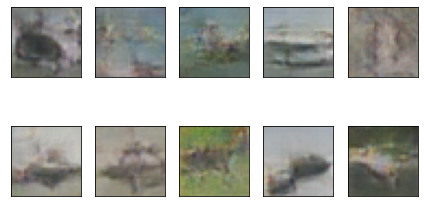

Time for epoch 196 is 25.01640486717224 sec
epoch = 197/400, d_loss=0.840, g_loss=4.383
Time for epoch 197 is 24.795110940933228 sec
epoch = 198/400, d_loss=0.040, g_loss=7.429
Time for epoch 198 is 24.881136178970337 sec
epoch = 199/400, d_loss=0.019, g_loss=5.380
Time for epoch 199 is 24.75138568878174 sec
epoch = 200/400, d_loss=0.205, g_loss=2.888
Time for epoch 200 is 24.548609733581543 sec
epoch = 201/400, d_loss=0.111, g_loss=1.709


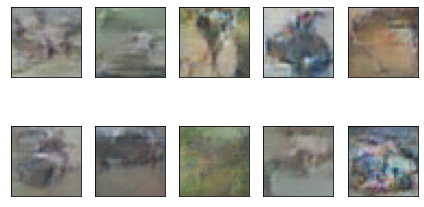

Time for epoch 201 is 25.2426540851593 sec
epoch = 202/400, d_loss=0.101, g_loss=5.844
Time for epoch 202 is 25.277634143829346 sec
epoch = 203/400, d_loss=0.462, g_loss=5.388
Time for epoch 203 is 24.626964569091797 sec
epoch = 204/400, d_loss=0.060, g_loss=3.249
Time for epoch 204 is 24.625446796417236 sec
epoch = 205/400, d_loss=0.049, g_loss=3.114
Time for epoch 205 is 24.83134889602661 sec
epoch = 206/400, d_loss=0.056, g_loss=5.288


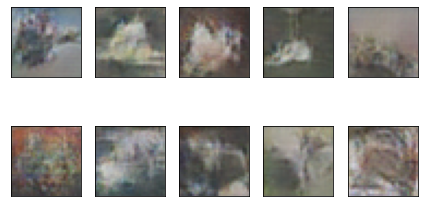

Time for epoch 206 is 25.40139079093933 sec
epoch = 207/400, d_loss=0.049, g_loss=4.991
Time for epoch 207 is 24.547369480133057 sec
epoch = 208/400, d_loss=0.102, g_loss=4.380
Time for epoch 208 is 24.646699905395508 sec
epoch = 209/400, d_loss=1.238, g_loss=0.850
Time for epoch 209 is 24.488919019699097 sec
epoch = 210/400, d_loss=0.081, g_loss=3.827
Time for epoch 210 is 24.350131273269653 sec
epoch = 211/400, d_loss=1.470, g_loss=0.515


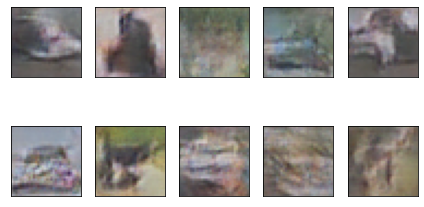

Time for epoch 211 is 24.712552785873413 sec
epoch = 212/400, d_loss=0.784, g_loss=4.098
Time for epoch 212 is 24.314464807510376 sec
epoch = 213/400, d_loss=1.010, g_loss=1.178
Time for epoch 213 is 24.329410791397095 sec
epoch = 214/400, d_loss=0.332, g_loss=2.790
Time for epoch 214 is 24.670970916748047 sec
epoch = 215/400, d_loss=0.401, g_loss=1.936
Time for epoch 215 is 24.430806398391724 sec
epoch = 216/400, d_loss=0.063, g_loss=4.818


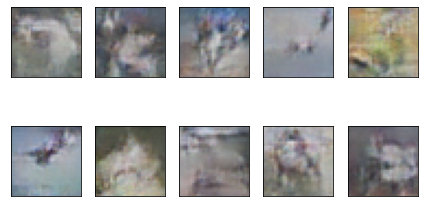

Time for epoch 216 is 24.602479457855225 sec
epoch = 217/400, d_loss=0.170, g_loss=2.660
Time for epoch 217 is 24.32179594039917 sec
epoch = 218/400, d_loss=0.221, g_loss=3.203
Time for epoch 218 is 24.342819213867188 sec
epoch = 219/400, d_loss=0.041, g_loss=2.333
Time for epoch 219 is 24.395427465438843 sec
epoch = 220/400, d_loss=0.138, g_loss=4.211
Time for epoch 220 is 24.353824853897095 sec
epoch = 221/400, d_loss=0.094, g_loss=4.026


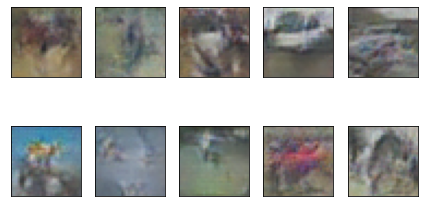

Time for epoch 221 is 24.69288206100464 sec
epoch = 222/400, d_loss=1.910, g_loss=6.593
Time for epoch 222 is 24.283066987991333 sec
epoch = 223/400, d_loss=0.373, g_loss=5.217
Time for epoch 223 is 24.08383798599243 sec
epoch = 224/400, d_loss=0.110, g_loss=2.148
Time for epoch 224 is 24.267775535583496 sec
epoch = 225/400, d_loss=0.099, g_loss=4.148
Time for epoch 225 is 24.304802894592285 sec
epoch = 226/400, d_loss=0.167, g_loss=2.239


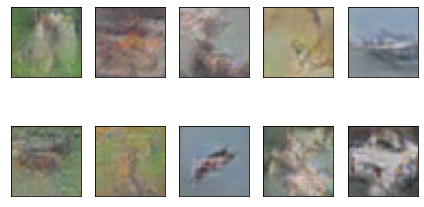

Time for epoch 226 is 24.478347778320312 sec
epoch = 227/400, d_loss=0.167, g_loss=5.789
Time for epoch 227 is 24.720422983169556 sec
epoch = 228/400, d_loss=0.007, g_loss=7.745
Time for epoch 228 is 24.23731255531311 sec
epoch = 229/400, d_loss=0.024, g_loss=8.293
Time for epoch 229 is 24.191431522369385 sec
epoch = 230/400, d_loss=0.044, g_loss=0.939
Time for epoch 230 is 24.231049299240112 sec
epoch = 231/400, d_loss=0.212, g_loss=5.531


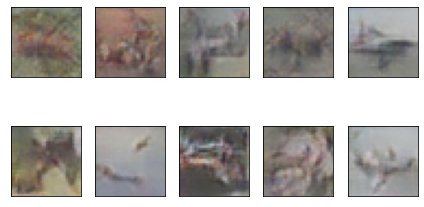

Time for epoch 231 is 24.708306789398193 sec
epoch = 232/400, d_loss=0.164, g_loss=4.148
Time for epoch 232 is 24.258554697036743 sec
epoch = 233/400, d_loss=0.351, g_loss=2.615
Time for epoch 233 is 24.35024666786194 sec
epoch = 234/400, d_loss=0.137, g_loss=3.328
Time for epoch 234 is 24.4123694896698 sec
epoch = 235/400, d_loss=0.541, g_loss=7.144
Time for epoch 235 is 24.2826509475708 sec
epoch = 236/400, d_loss=0.219, g_loss=4.466


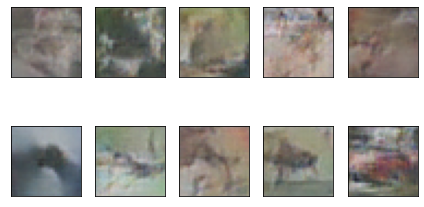

Time for epoch 236 is 24.550234079360962 sec
epoch = 237/400, d_loss=0.038, g_loss=6.189
Time for epoch 237 is 24.31045699119568 sec
epoch = 238/400, d_loss=0.013, g_loss=5.688
Time for epoch 238 is 24.254359245300293 sec
epoch = 239/400, d_loss=0.240, g_loss=4.938
Time for epoch 239 is 24.24198627471924 sec
epoch = 240/400, d_loss=1.417, g_loss=2.974
Time for epoch 240 is 24.77434277534485 sec
epoch = 241/400, d_loss=0.038, g_loss=4.257


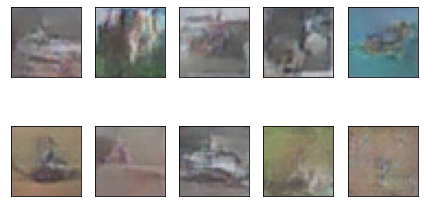

Time for epoch 241 is 24.663283109664917 sec
epoch = 242/400, d_loss=0.252, g_loss=3.194
Time for epoch 242 is 24.31467032432556 sec
epoch = 243/400, d_loss=1.275, g_loss=1.544
Time for epoch 243 is 24.240779638290405 sec
epoch = 244/400, d_loss=0.058, g_loss=1.186
Time for epoch 244 is 24.457919597625732 sec
epoch = 245/400, d_loss=0.053, g_loss=3.456
Time for epoch 245 is 24.238807201385498 sec
epoch = 246/400, d_loss=0.117, g_loss=5.093


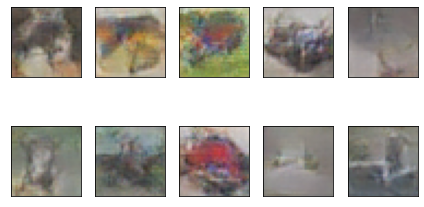

Time for epoch 246 is 24.865110635757446 sec
epoch = 247/400, d_loss=0.061, g_loss=3.150
Time for epoch 247 is 24.373221158981323 sec
epoch = 248/400, d_loss=0.215, g_loss=3.450
Time for epoch 248 is 24.27493929862976 sec
epoch = 249/400, d_loss=0.069, g_loss=4.035
Time for epoch 249 is 24.24735927581787 sec
epoch = 250/400, d_loss=0.136, g_loss=3.518
Time for epoch 250 is 24.382063150405884 sec
epoch = 251/400, d_loss=0.208, g_loss=3.324


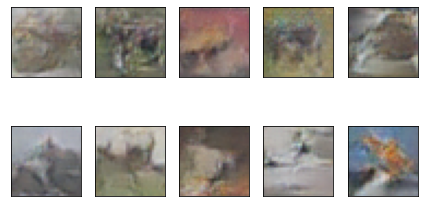

Time for epoch 251 is 24.816590785980225 sec
epoch = 252/400, d_loss=0.200, g_loss=3.200
Time for epoch 252 is 24.1852548122406 sec
epoch = 253/400, d_loss=0.321, g_loss=2.781
Time for epoch 253 is 24.57207703590393 sec
epoch = 254/400, d_loss=0.088, g_loss=2.736
Time for epoch 254 is 24.296859979629517 sec
epoch = 255/400, d_loss=0.033, g_loss=5.105
Time for epoch 255 is 24.183185577392578 sec
epoch = 256/400, d_loss=0.062, g_loss=4.361


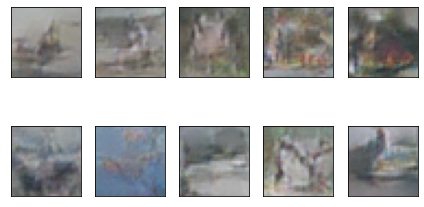

Time for epoch 256 is 24.65573477745056 sec
epoch = 257/400, d_loss=0.197, g_loss=3.193
Time for epoch 257 is 24.28153944015503 sec
epoch = 258/400, d_loss=0.088, g_loss=3.661
Time for epoch 258 is 24.091742992401123 sec
epoch = 259/400, d_loss=0.041, g_loss=2.961
Time for epoch 259 is 24.246896505355835 sec
epoch = 260/400, d_loss=0.176, g_loss=5.430
Time for epoch 260 is 24.18466544151306 sec
epoch = 261/400, d_loss=0.041, g_loss=5.675


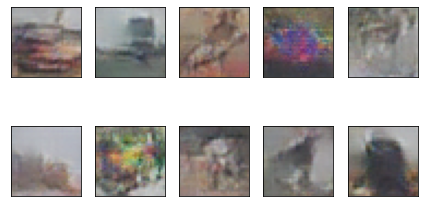

Time for epoch 261 is 24.491424083709717 sec
epoch = 262/400, d_loss=0.910, g_loss=1.009
Time for epoch 262 is 24.198659658432007 sec
epoch = 263/400, d_loss=0.297, g_loss=6.343
Time for epoch 263 is 24.1598162651062 sec
epoch = 264/400, d_loss=0.058, g_loss=2.106
Time for epoch 264 is 24.386303186416626 sec
epoch = 265/400, d_loss=0.076, g_loss=4.627
Time for epoch 265 is 24.932821035385132 sec
epoch = 266/400, d_loss=0.120, g_loss=2.854


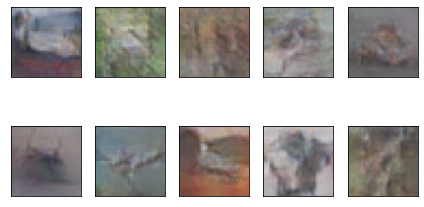

Time for epoch 266 is 26.216630935668945 sec
epoch = 267/400, d_loss=0.022, g_loss=6.677
Time for epoch 267 is 25.26570200920105 sec
epoch = 268/400, d_loss=0.025, g_loss=5.349
Time for epoch 268 is 25.32581377029419 sec
epoch = 269/400, d_loss=0.851, g_loss=2.331
Time for epoch 269 is 24.909005641937256 sec
epoch = 270/400, d_loss=0.747, g_loss=5.096
Time for epoch 270 is 25.035912036895752 sec
epoch = 271/400, d_loss=0.435, g_loss=6.010


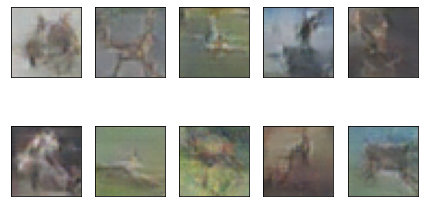

Time for epoch 271 is 25.407572031021118 sec
epoch = 272/400, d_loss=0.179, g_loss=2.939
Time for epoch 272 is 25.88277578353882 sec
epoch = 273/400, d_loss=0.221, g_loss=3.808
Time for epoch 273 is 25.864791870117188 sec
epoch = 274/400, d_loss=0.174, g_loss=4.039
Time for epoch 274 is 25.662283897399902 sec
epoch = 275/400, d_loss=0.031, g_loss=4.985
Time for epoch 275 is 25.513338565826416 sec
epoch = 276/400, d_loss=0.241, g_loss=4.858


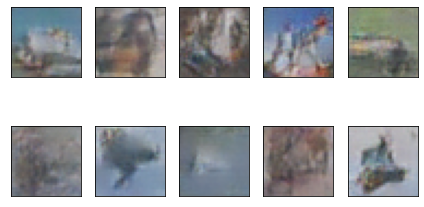

Time for epoch 276 is 26.169841289520264 sec
epoch = 277/400, d_loss=0.208, g_loss=2.352
Time for epoch 277 is 25.67190194129944 sec
epoch = 278/400, d_loss=0.272, g_loss=4.779
Time for epoch 278 is 26.066571474075317 sec
epoch = 279/400, d_loss=0.162, g_loss=4.877
Time for epoch 279 is 25.688949823379517 sec
epoch = 280/400, d_loss=0.011, g_loss=9.026
Time for epoch 280 is 25.96160578727722 sec
epoch = 281/400, d_loss=0.052, g_loss=4.300


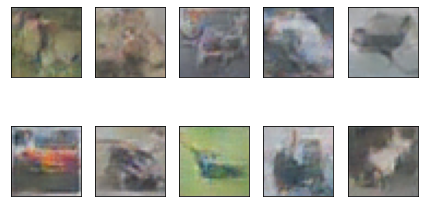

Time for epoch 281 is 25.735380172729492 sec
epoch = 282/400, d_loss=0.037, g_loss=3.502
Time for epoch 282 is 25.01635241508484 sec
epoch = 283/400, d_loss=0.029, g_loss=4.326
Time for epoch 283 is 24.92512798309326 sec
epoch = 284/400, d_loss=0.024, g_loss=3.344
Time for epoch 284 is 24.79089069366455 sec
epoch = 285/400, d_loss=1.310, g_loss=1.988
Time for epoch 285 is 24.820470333099365 sec
epoch = 286/400, d_loss=2.667, g_loss=4.356


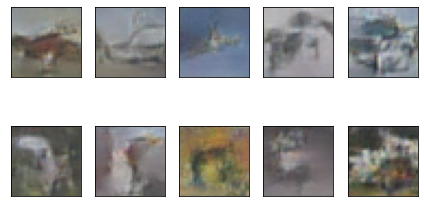

Time for epoch 286 is 25.476467847824097 sec
epoch = 287/400, d_loss=0.032, g_loss=2.538
Time for epoch 287 is 24.640609741210938 sec
epoch = 288/400, d_loss=0.033, g_loss=4.941
Time for epoch 288 is 24.5698721408844 sec
epoch = 289/400, d_loss=0.338, g_loss=3.987
Time for epoch 289 is 24.733013153076172 sec
epoch = 290/400, d_loss=0.108, g_loss=4.564
Time for epoch 290 is 24.977532148361206 sec
epoch = 291/400, d_loss=0.241, g_loss=3.313


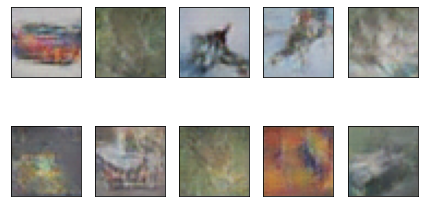

Time for epoch 291 is 25.413049697875977 sec
epoch = 292/400, d_loss=2.682, g_loss=1.305
Time for epoch 292 is 25.26255440711975 sec
epoch = 293/400, d_loss=0.144, g_loss=4.469
Time for epoch 293 is 25.353352069854736 sec
epoch = 294/400, d_loss=0.225, g_loss=4.688
Time for epoch 294 is 24.889715909957886 sec
epoch = 295/400, d_loss=0.143, g_loss=2.723
Time for epoch 295 is 24.7333722114563 sec
epoch = 296/400, d_loss=0.112, g_loss=4.049


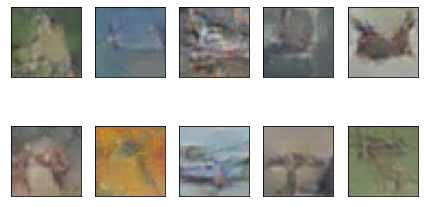

Time for epoch 296 is 25.30766534805298 sec
epoch = 297/400, d_loss=0.042, g_loss=5.752
Time for epoch 297 is 24.783437728881836 sec
epoch = 298/400, d_loss=0.147, g_loss=4.057
Time for epoch 298 is 24.54346203804016 sec
epoch = 299/400, d_loss=0.045, g_loss=2.792
Time for epoch 299 is 24.768942832946777 sec
epoch = 300/400, d_loss=0.094, g_loss=1.582
Time for epoch 300 is 24.818660736083984 sec
epoch = 301/400, d_loss=0.614, g_loss=1.665


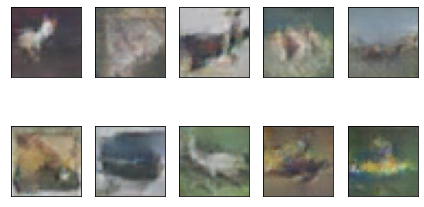

Time for epoch 301 is 25.132994651794434 sec
epoch = 302/400, d_loss=0.037, g_loss=7.254
Time for epoch 302 is 25.644869804382324 sec
epoch = 303/400, d_loss=0.009, g_loss=4.168
Time for epoch 303 is 24.85458731651306 sec
epoch = 304/400, d_loss=0.226, g_loss=5.969
Time for epoch 304 is 24.685198307037354 sec
epoch = 305/400, d_loss=0.159, g_loss=1.808
Time for epoch 305 is 25.01261615753174 sec
epoch = 306/400, d_loss=0.091, g_loss=5.290


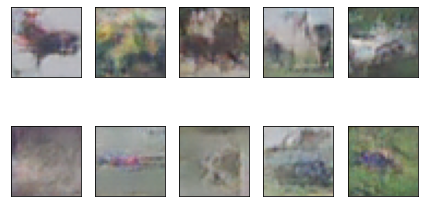

Time for epoch 306 is 25.243486404418945 sec
epoch = 307/400, d_loss=0.084, g_loss=3.711
Time for epoch 307 is 24.618402004241943 sec
epoch = 308/400, d_loss=0.066, g_loss=2.757
Time for epoch 308 is 24.781384468078613 sec
epoch = 309/400, d_loss=0.116, g_loss=3.282
Time for epoch 309 is 24.71893286705017 sec
epoch = 310/400, d_loss=0.510, g_loss=6.411
Time for epoch 310 is 24.655009508132935 sec
epoch = 311/400, d_loss=0.012, g_loss=3.511


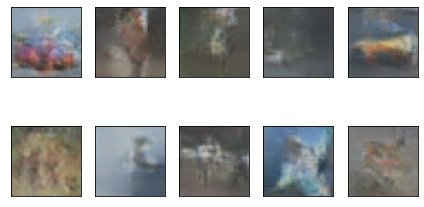

Time for epoch 311 is 25.10916805267334 sec
epoch = 312/400, d_loss=0.078, g_loss=1.913
Time for epoch 312 is 24.840356588363647 sec
epoch = 313/400, d_loss=0.115, g_loss=3.795
Time for epoch 313 is 24.734894514083862 sec
epoch = 314/400, d_loss=0.031, g_loss=6.443
Time for epoch 314 is 24.8114230632782 sec
epoch = 315/400, d_loss=0.114, g_loss=7.462
Time for epoch 315 is 25.228931427001953 sec
epoch = 316/400, d_loss=0.219, g_loss=3.463


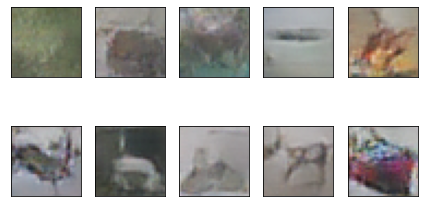

Time for epoch 316 is 24.91091823577881 sec
epoch = 317/400, d_loss=0.069, g_loss=6.194
Time for epoch 317 is 24.917231798171997 sec
epoch = 318/400, d_loss=0.042, g_loss=2.673
Time for epoch 318 is 24.83749508857727 sec
epoch = 319/400, d_loss=0.133, g_loss=5.306
Time for epoch 319 is 24.666327953338623 sec
epoch = 320/400, d_loss=0.133, g_loss=2.410
Time for epoch 320 is 24.704798698425293 sec
epoch = 321/400, d_loss=0.598, g_loss=2.330


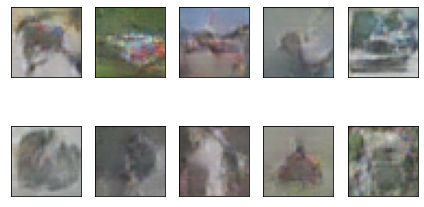

Time for epoch 321 is 25.03607439994812 sec
epoch = 322/400, d_loss=2.624, g_loss=2.703
Time for epoch 322 is 24.85845685005188 sec
epoch = 323/400, d_loss=0.050, g_loss=4.190
Time for epoch 323 is 24.70745325088501 sec
epoch = 324/400, d_loss=0.068, g_loss=5.440
Time for epoch 324 is 24.726608514785767 sec
epoch = 325/400, d_loss=0.145, g_loss=5.070
Time for epoch 325 is 24.73884606361389 sec
epoch = 326/400, d_loss=0.103, g_loss=5.841


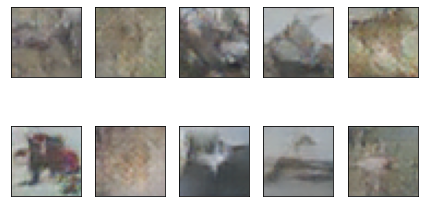

Time for epoch 326 is 25.35203456878662 sec
epoch = 327/400, d_loss=0.121, g_loss=4.504
Time for epoch 327 is 25.07683825492859 sec
epoch = 328/400, d_loss=0.219, g_loss=5.186
Time for epoch 328 is 24.70580005645752 sec
epoch = 329/400, d_loss=0.207, g_loss=5.410
Time for epoch 329 is 24.559095859527588 sec
epoch = 330/400, d_loss=0.190, g_loss=2.516
Time for epoch 330 is 24.494508028030396 sec
epoch = 331/400, d_loss=0.068, g_loss=4.217


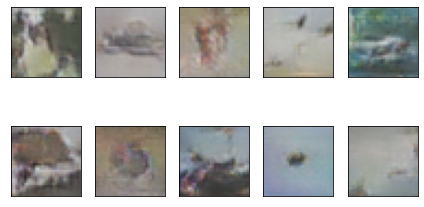

Time for epoch 331 is 24.97718620300293 sec
epoch = 332/400, d_loss=0.326, g_loss=3.974
Time for epoch 332 is 24.518373489379883 sec
epoch = 333/400, d_loss=0.095, g_loss=4.746
Time for epoch 333 is 24.513678073883057 sec
epoch = 334/400, d_loss=0.273, g_loss=3.862
Time for epoch 334 is 24.391223192214966 sec
epoch = 335/400, d_loss=0.141, g_loss=4.378
Time for epoch 335 is 24.49227809906006 sec
epoch = 336/400, d_loss=0.029, g_loss=4.731


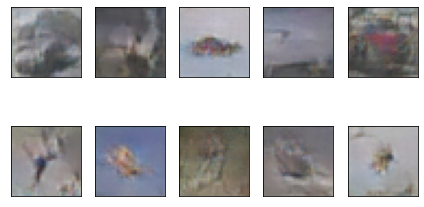

Time for epoch 336 is 24.691866636276245 sec
epoch = 337/400, d_loss=0.220, g_loss=2.259
Time for epoch 337 is 24.37297534942627 sec
epoch = 338/400, d_loss=0.222, g_loss=4.238
Time for epoch 338 is 24.494720697402954 sec
epoch = 339/400, d_loss=0.669, g_loss=5.772
Time for epoch 339 is 24.529846906661987 sec
epoch = 340/400, d_loss=0.155, g_loss=4.711
Time for epoch 340 is 25.06827402114868 sec
epoch = 341/400, d_loss=0.637, g_loss=2.042


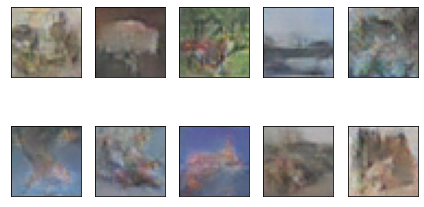

Time for epoch 341 is 25.12256932258606 sec
epoch = 342/400, d_loss=0.393, g_loss=4.961
Time for epoch 342 is 24.659159421920776 sec
epoch = 343/400, d_loss=0.527, g_loss=4.228
Time for epoch 343 is 24.48615860939026 sec
epoch = 344/400, d_loss=0.172, g_loss=3.461
Time for epoch 344 is 24.55002236366272 sec
epoch = 345/400, d_loss=0.056, g_loss=3.749
Time for epoch 345 is 24.615220308303833 sec
epoch = 346/400, d_loss=0.309, g_loss=3.935


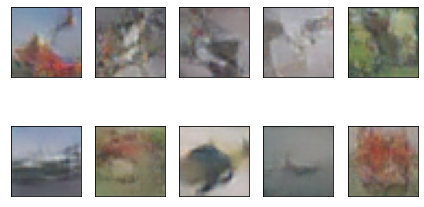

Time for epoch 346 is 24.977251529693604 sec
epoch = 347/400, d_loss=0.064, g_loss=5.449
Time for epoch 347 is 24.735963821411133 sec
epoch = 348/400, d_loss=0.569, g_loss=5.346
Time for epoch 348 is 24.721558809280396 sec
epoch = 349/400, d_loss=0.025, g_loss=3.413
Time for epoch 349 is 24.830864906311035 sec
epoch = 350/400, d_loss=0.007, g_loss=3.095
Time for epoch 350 is 24.850406885147095 sec
epoch = 351/400, d_loss=0.014, g_loss=5.568


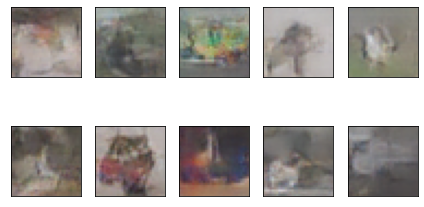

Time for epoch 351 is 25.349879026412964 sec
epoch = 352/400, d_loss=0.076, g_loss=4.452
Time for epoch 352 is 24.993629217147827 sec
epoch = 353/400, d_loss=0.019, g_loss=3.707
Time for epoch 353 is 24.700677394866943 sec
epoch = 354/400, d_loss=0.038, g_loss=3.222
Time for epoch 354 is 24.835968017578125 sec
epoch = 355/400, d_loss=0.130, g_loss=4.907
Time for epoch 355 is 24.51803207397461 sec
epoch = 356/400, d_loss=0.144, g_loss=4.701


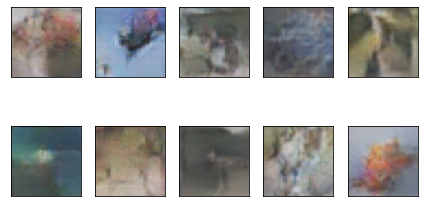

Time for epoch 356 is 25.00301718711853 sec
epoch = 357/400, d_loss=0.757, g_loss=7.002
Time for epoch 357 is 24.618703842163086 sec
epoch = 358/400, d_loss=2.393, g_loss=5.461
Time for epoch 358 is 24.634737491607666 sec
epoch = 359/400, d_loss=0.084, g_loss=4.612
Time for epoch 359 is 24.489223957061768 sec
epoch = 360/400, d_loss=0.172, g_loss=2.506
Time for epoch 360 is 24.633949995040894 sec
epoch = 361/400, d_loss=0.118, g_loss=6.583


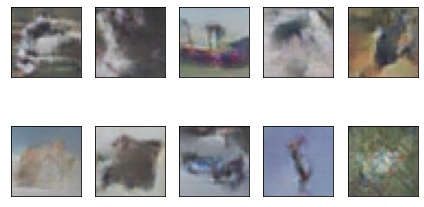

Time for epoch 361 is 25.04008436203003 sec
epoch = 362/400, d_loss=0.155, g_loss=3.945
Time for epoch 362 is 24.591012239456177 sec
epoch = 363/400, d_loss=0.189, g_loss=1.896
Time for epoch 363 is 24.53630828857422 sec
epoch = 364/400, d_loss=0.234, g_loss=2.822
Time for epoch 364 is 24.57404327392578 sec
epoch = 365/400, d_loss=0.084, g_loss=3.100
Time for epoch 365 is 24.942776203155518 sec
epoch = 366/400, d_loss=0.017, g_loss=5.173


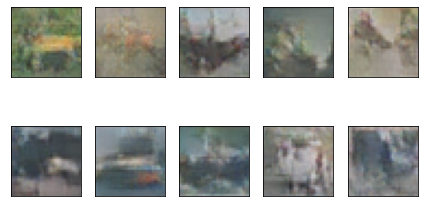

Time for epoch 366 is 25.205796241760254 sec
epoch = 367/400, d_loss=0.037, g_loss=3.816
Time for epoch 367 is 24.645599126815796 sec
epoch = 368/400, d_loss=0.359, g_loss=2.503
Time for epoch 368 is 24.463671445846558 sec
epoch = 369/400, d_loss=0.111, g_loss=3.851
Time for epoch 369 is 24.622252702713013 sec
epoch = 370/400, d_loss=0.008, g_loss=3.102
Time for epoch 370 is 24.54780387878418 sec
epoch = 371/400, d_loss=0.091, g_loss=2.179


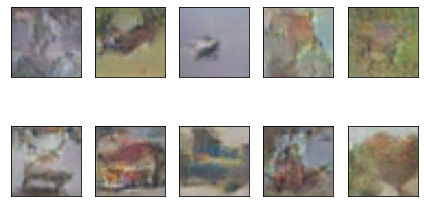

Time for epoch 371 is 24.967613458633423 sec
epoch = 372/400, d_loss=0.232, g_loss=3.445
Time for epoch 372 is 24.297276735305786 sec
epoch = 373/400, d_loss=0.590, g_loss=6.720
Time for epoch 373 is 24.426142930984497 sec
epoch = 374/400, d_loss=0.029, g_loss=3.130
Time for epoch 374 is 24.54074740409851 sec
epoch = 375/400, d_loss=0.249, g_loss=4.935
Time for epoch 375 is 24.39540123939514 sec
epoch = 376/400, d_loss=0.028, g_loss=3.372


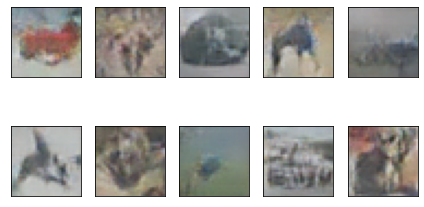

Time for epoch 376 is 24.75775384902954 sec
epoch = 377/400, d_loss=0.028, g_loss=5.081
Time for epoch 377 is 24.43923282623291 sec
epoch = 378/400, d_loss=0.821, g_loss=3.282
Time for epoch 378 is 24.902663230895996 sec
epoch = 379/400, d_loss=0.143, g_loss=4.008
Time for epoch 379 is 24.65742301940918 sec
epoch = 380/400, d_loss=0.210, g_loss=2.909
Time for epoch 380 is 24.59552502632141 sec
epoch = 381/400, d_loss=0.031, g_loss=4.888


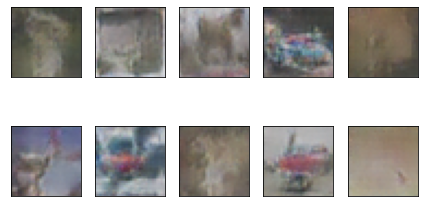

Time for epoch 381 is 24.907069206237793 sec
epoch = 382/400, d_loss=0.094, g_loss=3.794
Time for epoch 382 is 24.38324475288391 sec
epoch = 383/400, d_loss=0.055, g_loss=4.305
Time for epoch 383 is 24.678762674331665 sec
epoch = 384/400, d_loss=0.119, g_loss=6.329
Time for epoch 384 is 24.560434818267822 sec
epoch = 385/400, d_loss=0.165, g_loss=3.760
Time for epoch 385 is 24.381437301635742 sec
epoch = 386/400, d_loss=0.232, g_loss=3.799


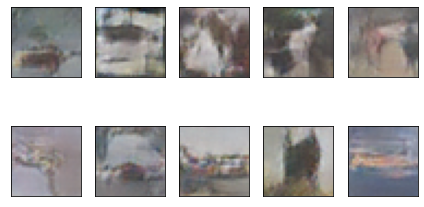

Time for epoch 386 is 24.857346296310425 sec
epoch = 387/400, d_loss=0.153, g_loss=1.995
Time for epoch 387 is 24.448219537734985 sec
epoch = 388/400, d_loss=0.061, g_loss=3.591
Time for epoch 388 is 24.41009783744812 sec
epoch = 389/400, d_loss=0.790, g_loss=6.911
Time for epoch 389 is 24.40524458885193 sec
epoch = 390/400, d_loss=0.025, g_loss=1.807
Time for epoch 390 is 24.934194803237915 sec
epoch = 391/400, d_loss=0.243, g_loss=5.190


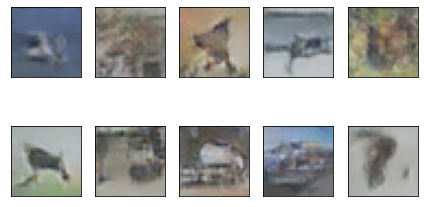

Time for epoch 391 is 25.014376640319824 sec
epoch = 392/400, d_loss=0.164, g_loss=7.800
Time for epoch 392 is 24.460211277008057 sec
epoch = 393/400, d_loss=0.162, g_loss=5.377
Time for epoch 393 is 24.52352261543274 sec
epoch = 394/400, d_loss=0.132, g_loss=3.793
Time for epoch 394 is 24.613744020462036 sec
epoch = 395/400, d_loss=0.104, g_loss=5.400
Time for epoch 395 is 24.409250259399414 sec
epoch = 396/400, d_loss=0.011, g_loss=5.292


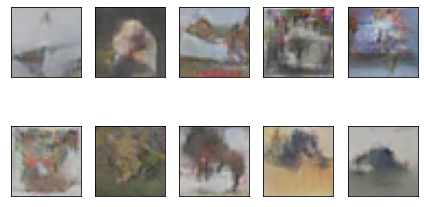

Time for epoch 396 is 24.966395616531372 sec
epoch = 397/400, d_loss=0.511, g_loss=6.709
Time for epoch 397 is 24.60434579849243 sec
epoch = 398/400, d_loss=0.101, g_loss=3.713
Time for epoch 398 is 24.43298840522766 sec
epoch = 399/400, d_loss=0.239, g_loss=2.700
Time for epoch 399 is 24.563105821609497 sec
epoch = 400/400, d_loss=0.023, g_loss=5.211
Time for epoch 400 is 24.439905166625977 sec


In [ ]:
# Step 1: Train a classifier C for CIFAR10 from scratch using (x_train, y_train)
# Step 2: Use x_train to train a GAN with latent dimension = 100 for 200 epochs
# Step 3: Generate 50,000 fake image samples
# Step 4: Use C to produce labels for all fake images
# Step 5: Train a classifier C' from scratch using the fake images and the predicted labels
# Step 6: Compare C and C' on (x_test, y_test)

#CIFAR10 data set contains 50k 32x32 images in the training set, and 10k images in the test set
num_imgs = 50000

# plot random generated fake images 
fig = plt.figure(figsize=(8,3))
for i in range(0, 10):
    plt.subplot(2, 5, 1 + i, xticks=[], yticks=[])
    plt.imshow(x_train[i])
plt.tight_layout()

# # reshape the training input and cast as float32
# print(f"x_train shape: {x_train.shape}, type: {type(x_train)}")

# normalize the training input
x_train = (np.float32(x_train)/255) - 0.5
x_train = tf.data.Dataset.from_tensor_slices(x_train).shuffle(num_imgs).batch(batch_size, drop_remainder=True)

# # get number of batches
# num_batch = num_imgs // batch_size

# define all the models
generator = define_generator()
discriminator = define_discriminator()
gan = define_gan(generator,discriminator)

#train the models
train(g_model=generator, d_model=discriminator, gan_model=gan, dataset=x_train, n_batch=batch_size)



In [ ]:
# Step 3: Generate 50,000 fake image samples
latent_dim = 100
num_imgs = 50000

# randomly generate 50000 training data set
random_noise = np.random.normal(size=(num_imgs,latent_dim))
random_img = generator.predict_on_batch(random_noise)
x_fake_train = random_img



# Step 4: Use c to produce labels for all fake images
# make test prediction
y_pred_test = model.predict_proba(x_fake_train)
y_pred_test_labels = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)


#

# Step 5: Train a classifier c' from scratch using the fake images and the predicted labels
pred_label = y_pred_test_labels[:]
y_fake_train = pred_label
y_fake_train = np.reshape(y_fake_train,(50000,1))
x_fake_train  = [((x/255) - 0.5) for x in x_fake_train]
x_fake_train = np.array(x_fake_train)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_fake_train)

INIT_LR = 5e-3  # initial learning rate
BATCH_SIZE = 32
EPOCHS =100

model1 = make_model()  # define our model


model1.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
    metrics=['accuracy']  # report accuracy during training
)
# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.95 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model1.optimizer.lr))


# we will save model checkpoints to continue training in case of kernel death
model_filename = 'fake_cifar.hdf5'
last_finished_epoch = None
print(f"x_test2: {len(x_test2)}")

# fit model
model1.fit(
    x_fake_train, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               TqdmProgressCallback(),
               ModelSaveCallback(model_filename)],
    #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)

# save weights to file
model1.save_weights("fake_weights.h5")

# x_test for the original classifier c'
y__fake_pred_test = model1.predict_proba(x_test2)
y__fake_pred_test_classes = np.argmax(y__fake_pred_test, axis=1)
y__fake_pred_test_max_probas = np.max(y__fake_pred_test, axis=1)

# Step 6: Compare c and c' on (x_test, y_test)
print("c test accuracy:", accuracy_score(y_test[:], y_pred_test_classes))
print("c' test accuracy:", accuracy_score(y_test[:], y__fake_pred_test_classes))

x_test2: 10000
Learning rate: 0.005
Epoch 1/100


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in fake_cifar.hdf5
Learning rate: 0.00475
Epoch 2/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0045125
Epoch 3/100



Model saved in fake_cifar.hdf5
Learning rate: 0.004286875
Epoch 4/100



Model saved in fake_cifar.hdf5
Learning rate: 0.004072531
Epoch 5/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0038689047
Epoch 6/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0036754594
Epoch 7/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0034916864
Epoch 8/100



Model saved in fake_cifar.hdf5
Learning rate: 0.003317102
Epoch 9/100



Model saved in fake_cifar.hdf5
Learning rate: 0.003151247
Epoch 10/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0029936847
Epoch 11/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0028440005
Epoch 12/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0027018005
Epoch 13/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0025667103
Epoch 14/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0024383748
Epoch 15/100



Model saved in fake_cifar.hdf5
Learning rate: 0.002316456
Epoch 16/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0022006333
Epoch 17/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0020906017
Epoch 18/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0019860717
Epoch 19/100



Model saved in fake_cifar.hdf5
Learning rate: 0.001886768
Epoch 20/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0017924296
Epoch 21/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0017028081
Epoch 22/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0016176677
Epoch 23/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0015367843
Epoch 24/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0014599451
Epoch 25/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0013869478
Epoch 26/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0013176005
Epoch 27/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0012517205
Epoch 28/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0011891344
Epoch 29/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0011296778
Epoch 30/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0010731939
Epoch 31/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0010195341
Epoch 32/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00096855743
Epoch 33/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00092012953
Epoch 34/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00087412307
Epoch 35/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0008304169
Epoch 36/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00078889605
Epoch 37/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0007494513
Epoch 38/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0007119787
Epoch 39/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0006763798
Epoch 40/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0006425608
Epoch 41/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00061043276
Epoch 42/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0005799111
Epoch 43/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00055091555
Epoch 44/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00052336976
Epoch 45/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0004972013
Epoch 46/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00047234123
Epoch 47/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00044872417
Epoch 48/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00042628794
Epoch 49/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00040497354
Epoch 50/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00038472487
Epoch 51/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00036548864
Epoch 52/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0003472142
Epoch 53/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0003298535
Epoch 54/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00031336083
Epoch 55/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00029769278
Epoch 56/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00028280815
Epoch 57/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00026866773
Epoch 58/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00025523434
Epoch 59/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00024247263
Epoch 60/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00023034899
Epoch 61/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00021883154
Epoch 62/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00020788997
Epoch 63/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00019749546
Epoch 64/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0001876207
Epoch 65/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00017823966
Epoch 66/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00016932767
Epoch 67/100



Model saved in fake_cifar.hdf5
Learning rate: 0.0001608613
Epoch 68/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00015281823
Epoch 69/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00014517731
Epoch 70/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00013791845
Epoch 71/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00013102253
Epoch 72/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00012447141
Epoch 73/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00011824783
Epoch 74/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00011233544
Epoch 75/100



Model saved in fake_cifar.hdf5
Learning rate: 0.00010671867
Epoch 76/100



Model saved in fake_cifar.hdf5
Learning rate: 0.000101382735
Epoch 77/100



Model saved in fake_cifar.hdf5
Learning rate: 9.63136e-05
Epoch 78/100



Model saved in fake_cifar.hdf5
Learning rate: 9.149792e-05
Epoch 79/100



Model saved in fake_cifar.hdf5
Learning rate: 8.692302e-05
Epoch 80/100



Model saved in fake_cifar.hdf5
Learning rate: 8.257687e-05
Epoch 81/100



Model saved in fake_cifar.hdf5
Learning rate: 7.844803e-05
Epoch 82/100



Model saved in fake_cifar.hdf5
Learning rate: 7.4525626e-05
Epoch 83/100



Model saved in fake_cifar.hdf5
Learning rate: 7.0799346e-05
Epoch 84/100



Model saved in fake_cifar.hdf5
Learning rate: 6.725938e-05
Epoch 85/100



Model saved in fake_cifar.hdf5
Learning rate: 6.389641e-05
Epoch 86/100



Model saved in fake_cifar.hdf5
Learning rate: 6.070159e-05
Epoch 87/100



Model saved in fake_cifar.hdf5
Learning rate: 5.7666508e-05
Epoch 88/100



Model saved in fake_cifar.hdf5
Learning rate: 5.4783184e-05
Epoch 89/100



Model saved in fake_cifar.hdf5
Learning rate: 5.2044026e-05
Epoch 90/100



Model saved in fake_cifar.hdf5
Learning rate: 4.9441824e-05
Epoch 91/100



Model saved in fake_cifar.hdf5
Learning rate: 4.6969733e-05
Epoch 92/100



Model saved in fake_cifar.hdf5
Learning rate: 4.4621247e-05
Epoch 93/100



Model saved in fake_cifar.hdf5
Learning rate: 4.2390184e-05
Epoch 94/100



Model saved in fake_cifar.hdf5
Learning rate: 4.0270676e-05
Epoch 95/100



Model saved in fake_cifar.hdf5
Learning rate: 3.825714e-05
Epoch 96/100



Model saved in fake_cifar.hdf5
Learning rate: 3.6344285e-05
Epoch 97/100



Model saved in fake_cifar.hdf5
Learning rate: 3.452707e-05
Epoch 98/100



Model saved in fake_cifar.hdf5
Learning rate: 3.2800715e-05
Epoch 99/100



Model saved in fake_cifar.hdf5
Learning rate: 3.1160682e-05
Epoch 100/100



Model saved in fake_cifar.hdf5
c test accuracy: 0.8321
c' test accuracy: 0.09


## **Part 5: Visualize Class Activiation Map**

Using the code described in 

https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/5.4-visualizing-what-convnets-learn.ipynb 

Implement the class activation map (CAM) to show the parts of the test images above that led your CNN to its final classification decision

In [ ]:
from keras.models import load_model

model = load_model(model_path)
model.summary()

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_53 (Conv2D)           (None, 32, 32, 16)        448       
_________________________________________________________________
leaky_re_lu_87 (LeakyReLU)   (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 32, 32, 32)        4640      
_________________________________________________________________
leaky_re_lu_88 (LeakyReLU)   (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_40 (Dropout)         (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 16, 16, 32)      

Shape of the image: (32, 32, 3)


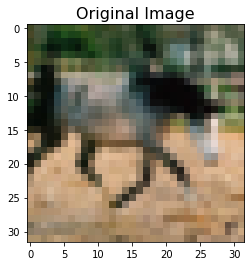

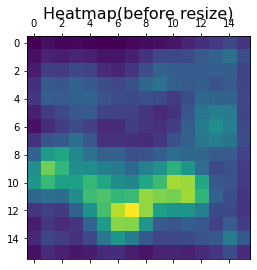

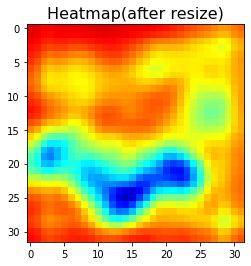

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


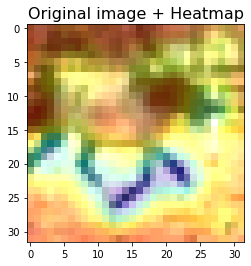

In [ ]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Show a horse image x_train[52].
plt.imshow(x_train[52])
plt.title('Original Image', fontsize=16)

# Import the libraries
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np
import cv2

# Pick a horse image x_train[52] to show the heatmap.
img = x_train[52]
print('Shape of the image:', np.shape(img))

# 'x' is a numpy array of shape (32, 32, 3)
x = image.img_to_array(img)

# A dimension was added to increse the "batch", the dimension of the array is now (1, 32, 32, 3)
x = np.expand_dims(x, axis=0)

# This is the "horse" entry in the prediction vector, 7 is the class of horse
horse = model.output[:, 7]

# This is the output feature map of the 'conv2d_16' layer,
# the last convolutional layer in our architecture
last_conv_layer = model.get_layer('conv2d_56')

# This is the gradient of the "horse" class with regard to
# the output feature map of 'conv2d_16'
grads = K.gradients(horse, last_conv_layer.output)[0]


# This is a vector of shape (64,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# 'pooled_grads' and the output feature map of 'conv2d_16', given a sample image.
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of one horse
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array by "how important this channel is" with regard to the horse class
for i in range(10):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis= -1)

heatmap = np.abs(heatmap)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.title('Heatmap(before resize)', fontsize=16)
plt.show()



# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# Convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
#print(np.shape(heatmap),'after resize')
plt.imshow(heatmap)
plt.title('Heatmap(after resize)', fontsize=16)
plt.show()
superimposed_img = heatmap * 0.4 + img

superimposed_img = superimposed_img.astype(int)

# Save the image to disk
plt.imshow(superimposed_img)
plt.title('Original image + Heatmap', fontsize=16)
plt.show()
